# MCMC Model

In [295]:
import numpy as np
import matplotlib.pyplot as plt
import emcee
from tabulate import tabulate
import corner
from scipy import signal
from IPython.display import Image
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import chi2
%matplotlib inline

In [ ]:
# Read in GHG ice core data
icecore = pd.read_csv('data/Vostok-Data.csv')
icecore = icecore.replace('#N/A', pd.NA).dropna()
icecore = icecore.apply(lambda x: x.str.replace(',', '.') if x.dtype == "object" else x)

# Format column names
icecore.columns = ['YearAD', 'Temp', 'CO2ppm', 'CH4ppb', 'GAST_2.5', 'GAST_50', 'GAST_97.5', 'Ecc', 'Obl', 'Prec']

# Convert 'YearAD' to integer and the rest of the columns to float
icecore['YearAD'] = icecore['YearAD'].astype(int)
icecore.iloc[:, 1:] = icecore.iloc[:, 1:].astype(float)


milank = pd.read_csv('data/Ecc_Obl_Prec.csv')
milank = milank.replace('#N/A', pd.NA).dropna()
milank = milank.apply(lambda x: x.str.replace(',', '.') if x.dtype == "object" else x)

# Format column names
milank.columns = ['YearAD', 'Ecc', 'Obl', 'Prec']

# Convert 'YearAD' to integer and the rest of the columns to float
milank['YearAD'] = milank['YearAD'].astype(int)
milank.iloc[:, 1:] = milank.iloc[:, 1:].astype(float)

for i in ['Ecc', 'Obl', 'Prec']:
    icecore[i] = milank[i]

print(icecore.columns)
icecore.head()

Index(['YearAD', 'Temp', 'CO2ppm', 'CH4ppb', 'GAST_2.5', 'GAST_50',
       'GAST_97.5', 'Ecc', 'Obl', 'Prec'],
      dtype='object')


,YearAD,Temp,CO2ppm,CH4ppb,GAST_2.5,GAST_50,GAST_97.5,Ecc,Obl,Prec
0,-798,-8.6213,190.06,435.32,-10.14,-6.53,-3.63,0.016702,0.409093,1.796257
1,-797,-8.6449,188.54,402.37,-9.73,-6.25,-3.80,0.017161,0.411353,1.497928
2,-796,-8.3792,191.48,420.32,-9.31,-6.04,-3.36,0.017497,0.413555,1.200024
3,-795,-7.6399,196.63,427.55,-8.79,-5.86,-3.07,0.017846,0.415639,0.903494
4,-794,-6.6322,203.73,435.42,-9.21,-5.58,-3.00,0.018211,0.417555,0.611381


The Earth's orbital parameters of ellipticity, obliquity and precession vary in predictable ways.  One commonly used model for variations in them over the last few hundred million years was published by Laskar et al. (2004; http://dx.doi.org/10.1051/0004-6361:20041335).  

Let's take a look at the behavior of the last few million years using the data file from the Laskar et al. (2004) paper. 

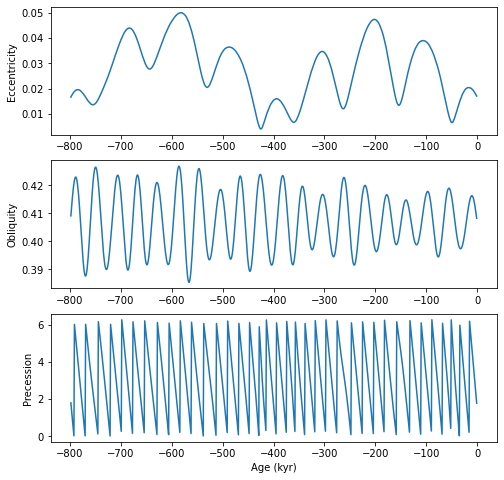

In [80]:
# set up the plot as three rows
# start with Eccentricity
fig=plt.figure(1,(8,8)) # make a nice big plot
fig.add_subplot(311) # notice how you do not need the commas!
plt.plot(icecore['YearAD'], icecore['Ecc'])
plt.ylabel('Eccentricity')

# add obliquity
fig.add_subplot(312)
plt.plot(icecore['YearAD'],icecore['Obl'])
plt.ylabel('Obliquity')

# add precession
fig.add_subplot(313)
plt.plot(icecore['YearAD'],icecore['Prec'])
plt.ylabel('Precession')
plt.xlabel('Age (kyr)');

The data are cast as $\delta ^{18}O$, defined as: 


$$\delta^{18}\mathrm{O} = \left( \frac{(^{18}\mathrm{O}/^{16}\mathrm{O})_{\mathrm{sample}}}{(^{18}\mathrm{O}/^{16}\mathrm{O})_{\mathrm{standard}}} - 1 \right) \times 1000 \ \text{‰}$$

And it is traditional to plot them with the heavier isotope down.  

Let's plot them up for the last million years. 

Index(['Age (ka)', 'd18O', 'uncertainty'], dtype='object')


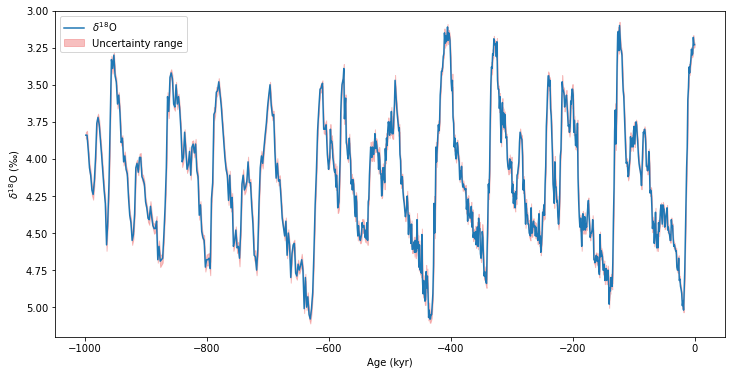

In [4]:
d18O = pd.read_csv('data/LR04stack.csv')

# Print the columns
print(d18O.columns)

# Make ages negative
d18O['Age (ka)'] = -d18O['Age (ka)']

# Filter data for the last 1 million years
d18O_1Ma = d18O[d18O['Age (ka)'] > -1000]

# Plot the main d18O data
fig = plt.figure(figsize=(12, 6))  # Increase the size of the plot
plt.plot(d18O_1Ma['Age (ka)'], d18O_1Ma['d18O'], label='$\delta ^{18}$O')

# Calculate the upper and lower bounds based on uncertainty
upper_bound = d18O_1Ma['d18O'] + 0.5 * d18O_1Ma['uncertainty']
lower_bound = d18O_1Ma['d18O'] - 0.5 * d18O_1Ma['uncertainty']

# Fill the area between the upper and lower bounds with light red color
plt.fill_between(d18O_1Ma['Age (ka)'], lower_bound, upper_bound, color='lightcoral', alpha=0.5, label='Uncertainty range')

# Label the axes
plt.xlabel('Age (kyr)')
plt.ylabel('$\delta ^{18}$O (‰)')
plt.ylim(5.2, 3)

# Add a legend
plt.legend()

# Show the plot
plt.show()

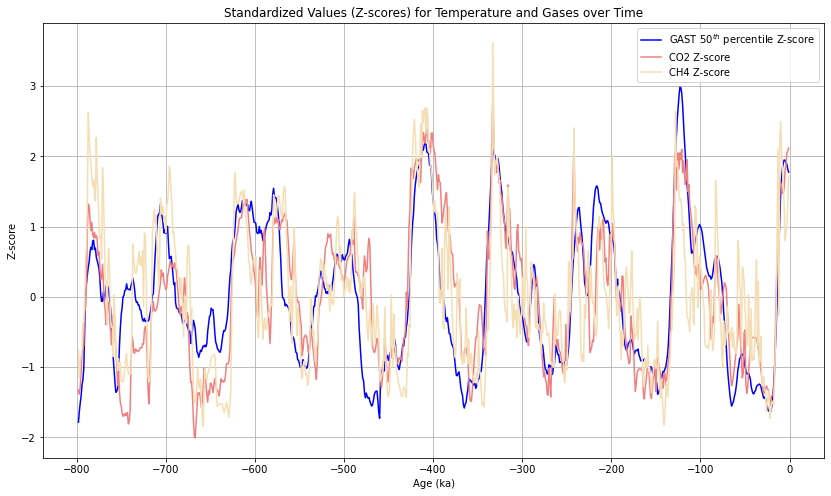

In [5]:
# Step 3: Compute the mean and standard deviation
mean_temp = icecore['GAST_50'].mean()
std_temp = icecore['GAST_50'].std()
mean_co2 = icecore['CO2ppm'].mean()
std_co2 = icecore['CO2ppm'].std()
mean_ch4 = icecore['CH4ppb'].mean()
std_ch4 = icecore['CH4ppb'].std()

# Step 4: Calculate the Z-scores
icecore['GAST_50_z'] = (icecore['GAST_50'] - mean_temp) / std_temp
icecore['CO2_z'] = (icecore['CO2ppm'] - mean_co2) / std_co2
icecore['CH4_z'] = (icecore['CH4ppb'] - mean_ch4) / std_ch4

# Step 5: Plot the data
plt.figure(figsize=(14, 8))

# Plot Temperature as a blue line
plt.plot(icecore['YearAD'], icecore['GAST_50_z'], label='GAST $50^{th}$ percentile Z-score', color='blue')

# Plot gases with different shades of red/orange
plt.plot(icecore['YearAD'], icecore['CO2_z'], label='CO2 Z-score', color='lightcoral')
plt.plot(icecore['YearAD'], icecore['CH4_z'], label='CH4 Z-score', color='wheat')

# Add labels and title
plt.xlabel('Age (ka)')
plt.ylabel('Z-score')
plt.title('Standardized Values (Z-scores) for Temperature and Gases over Time')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


Both insolation and $\delta ^{18}$O have a lot of wiggles over the last million years, but are they the SAME wiggles?  One way to look at this is using _time series analysis_.   There are entire courses devoted to this subject and a complete treatment is WAY beyond the scope of this class, but we can begin to answer the basic question posed by the isotope/insolation story.  The big question is:  Do the two data sets have wiggles with the same frequencies?  

The analysis boils down to this: 

- According to Fourier, any periodic function $f(t)$ can be represented as the sum of a series of sines and cosines:   

$$f(t)=a_0+ \sum_{r=1}^\infty \bigr[a_r    \cos  \bigr( { {2\pi r}\over{T}}   t\bigr)  + b_r    \sin  \bigr( { {2\pi r}\over{T}}   t\bigl) \bigl]  $$

- You can represent data as a series in time (in the time-domain) as we have been doing OR you can represent the data in terms of frequency, looking for the _power_ in the data as a function of frequency.  This is known as the _power spectrum_. 


Let's do a zero order analysis that produces a _periodogram_, which is a plot of power versus frequency. We will do this with the minimum of massaging.


Let us take advantage of a **signal.periodogram** function in the **scipy** package.  That module has functions that allow us to  calculate the _power spectral density_ for a time series.  

Also, we know that eccentricity is supposed to have a dominant period at 100 kyr, obliquity at 41 kyr and precession at 23 and 19 kyr. Remember that these numbers are expressed in terms of  the period, which is the inverse of the frequency. 

We can see how our minimalist treatment works.  

Let's start with precession:

In [6]:
# first we import the necessary function:
from scipy import signal 

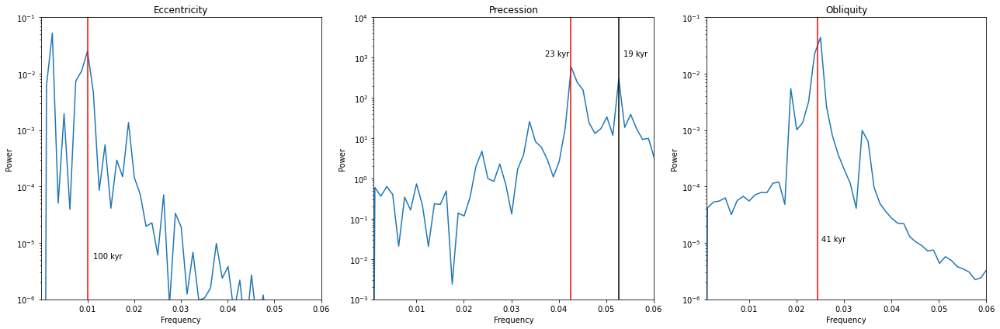

In [139]:
# Assume icecore data is already loaded and contains 'Ecc', 'Prec', and 'Obl' columns

ecc = np.array(icecore['Ecc'])
prec = np.array(icecore['Prec'])
obl = np.array(icecore['Obl'])

# Calculate the frequencies and power for each series
ecc_freqs, ecc_power = signal.periodogram(ecc)
prec_freqs, prec_power = signal.periodogram(prec)
obl_freqs, obl_power = signal.periodogram(obl)

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Eccentricity subplot
axes[0].semilogy(ecc_freqs, ecc_power)
axes[0].set_ylim(0.000001, 0.1)
axes[0].set_xlim(0.0001, 0.06)
axes[0].axvline(x=1./100., color='red')
axes[0].set_xlabel('Frequency')
axes[0].set_ylabel('Power')
axes[0].text(1./70., 0.000005, '100 kyr', ha='center', va='bottom')
axes[0].set_title('Eccentricity')

# Precession subplot
axes[1].semilogy(prec_freqs, prec_power)
axes[1].set_ylim(0.001, 10000)
axes[1].set_xlim(0.001, 0.06)
axes[1].axvline(x=1./23.5, color='red')
axes[1].axvline(x=1./19., color='black')
axes[1].set_xlabel('Frequency')
axes[1].set_ylabel('Power')
axes[1].text(1./25.2, 1000, '23 kyr', ha='center', va='bottom')
axes[1].text(1./17.8, 1000, '19 kyr', ha='center', va='bottom')
axes[1].set_title('Precession')

# Obliquity subplot
axes[2].semilogy(obl_freqs, obl_power)
axes[2].set_ylim(0.000001, 0.1)
axes[2].set_xlim(0.001, 0.06)
axes[2].axvline(x=1./41., color='red')
axes[2].set_xlabel('Frequency')
axes[2].set_ylabel('Power')
axes[2].text(1./36., 0.00001, '41 kyr', ha='center', va='bottom')
axes[2].set_title('Obliquity')

# Adjust layout
plt.tight_layout()
plt.show()


It is a little rough but you can clearly see the two peaks near 23 and 19 kyr. We could smooth out the diagram by exploring _windowing_ options, but for now, let us just plow on, looking at obliquity next.  

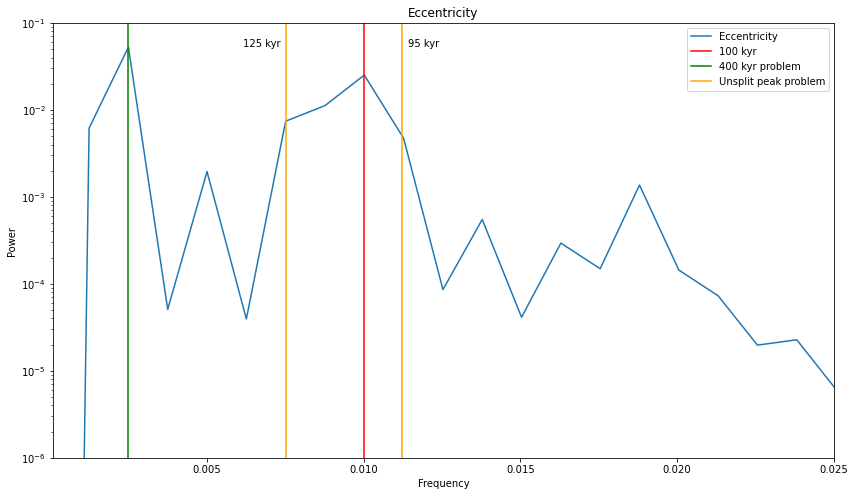

In [164]:
# Plot problems with Eccentricity
plt.figure(figsize=(14, 8))

plt.semilogy(ecc_freqs, ecc_power, label='Eccentricity')
plt.ylim(0.000001, 0.1)
plt.xlim(0.0001, 0.025)
plt.axvline(x=1./100., color='red', label='100 kyr')
plt.axvline(x=1./400., color='green', label='400 kyr problem')
plt.axvline(x=1./133., color='orange', label='Unsplit peak problem')
plt.axvline(x=1./89., color='orange')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.text(1./84., 0.05, '95 kyr', ha='center', va='bottom')
plt.text(1./148., 0.05, '125 kyr', ha='center', va='bottom')
plt.title('Eccentricity')
plt.legend(loc='upper right')
plt.show()


Note the strong obliquity (41 kyr) signal.

### Are there orbital frequencies in the isotopic data? 

At last we can look at our isotope time series and see if the same frequencies are there.  If so, that would support Milankovitch's famous hypothesis regarding orbits and ice ages.  

We will also throw in an example of a _window_ in the periodogram calculation.  What a _window_ does is multiply the time series by a function (called a taper) that weights information, suppressing data at the edges of the window and focussing on the center of the window.  The simplest window is a _box car_ which gives equal weight to everything inside the window.  In the following, we will use a _Blackman window_ which looks more like a bell curve.   

You can find out more about windowing (a.k.a. tapering) from this website:  

https://en.wikipedia.org/wiki/Window_function

Let's take a look at the LR04 data set. 

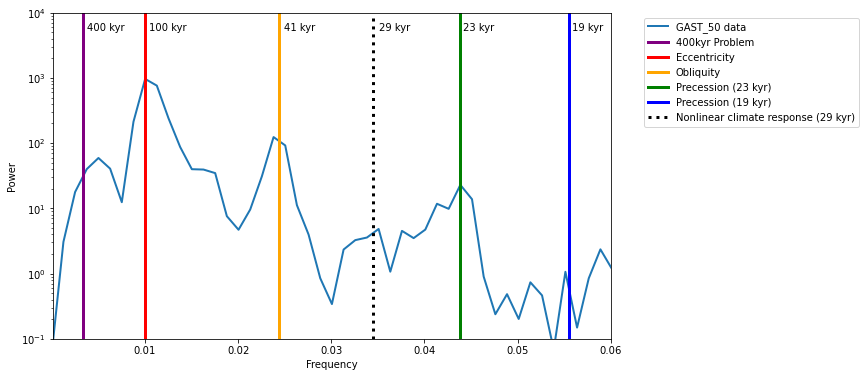

In [194]:
plt.figure(4,(10,6))
iso=icecore['GAST_50'] # pick out the data series
# set the window with the keyword 'window'
iso_freqs,iso_power=signal.periodogram(iso,window='blackman')
plt.semilogy(iso_freqs,iso_power,label='GAST_50 data',linewidth=2)
plt.ylim(.1,10000) # put bounds on the axes
plt.xlim(.0001,.06)
plt.axvline(x=1./300.,color='purple',label='400kyr Problem',linewidth=3) 
plt.axvline(x=1./100.,color='red',label='Eccentricity',linewidth=3) 
plt.axvline(x=1./41.,color='orange',label='Obliquity',linewidth=3) 
plt.axvline(x=1./22.8,color='green',label='Precession (23 kyr)',linewidth=3) 
plt.axvline(x=1./18.,color='blue',label='Precession (19 kyr)',linewidth=3)
plt.axvline(x=1./29.,color='black',label='Nonlinear climate response (29 kyr)',linewidth=3,linestyle='dotted')
plt.text(1./17.4, 5000, '19 kyr', ha='center', va='bottom')
plt.text(1./21.8, 5000, '23 kyr', ha='center', va='bottom')
plt.text(1./27.2, 5000, '29 kyr', ha='center', va='bottom')
plt.text(1./37.6, 5000, '41 kyr', ha='center', va='bottom')
plt.text(1./80, 5000, '100 kyr', ha='center', va='bottom')
plt.text(1./172, 5000, '400 kyr', ha='center', va='bottom')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2) # notice this
# way of putting the legend to the right of the plot

plt.xlabel('Frequency')
plt.ylabel('Power'); 

And... of course there is lots of power in the Milankovitch periods. But there is an extra 'hump' at 29 kyr which Lisecki and Raymo say is, "commonly observed and is thought to be a nonlinear climate response", citing a paper by Huybers and Wunsch (2004).  Hmmm. Room for more research. 

Of course there are still many questions on this subject, like "How do the orbital parameters control the ice volume?" and, "Why aren't we heading into an ice age now?" as Milankovitch theory would predict.  

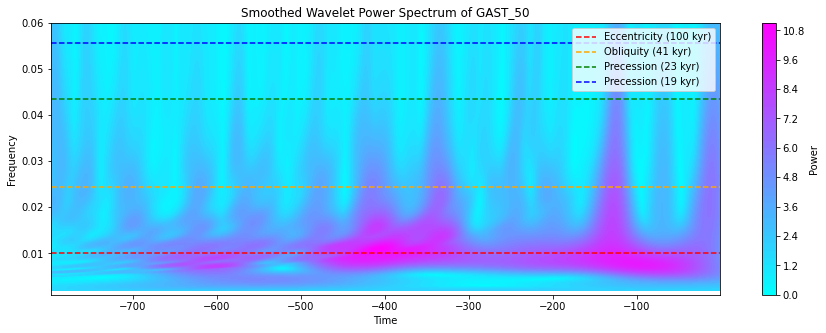

In [215]:
import pywt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from scipy.ndimage import gaussian_filter

# Assuming `iso` contains your GAST_50 data series
# Perform Continuous Wavelet Transform
iso_detrended = signal.detrend(iso)
scales = np.arange(1, 256)
coefficients, frequencies = pywt.cwt(iso_detrended, scales, 'cmor')

# Apply smoothing to the wavelet power spectrum coefficients
smoothed_coefficients = gaussian_filter(np.abs(coefficients), sigma=2)

# Plot the smoothed wavelet power spectrum using contourf
plt.figure(figsize=(15, 5))
plt.contourf(np.arange(len(iso))-len(iso), frequencies, smoothed_coefficients, 100, cmap='cool')
plt.colorbar(label='Power')
plt.axhline(y=1./100., color='red', linestyle='--', label='Eccentricity (100 kyr)')
plt.axhline(y=1./41., color='orange', linestyle='--', label='Obliquity (41 kyr)')
plt.axhline(y=1./23., color='green', linestyle='--', label='Precession (23 kyr)')
plt.axhline(y=1./18., color='blue', linestyle='--', label='Precession (19 kyr)')
plt.ylim(0.06, .001)
plt.gca().invert_yaxis()  # Invert y-axis to have higher frequencies at the bottom
plt.title('Smoothed Wavelet Power Spectrum of GAST_50')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

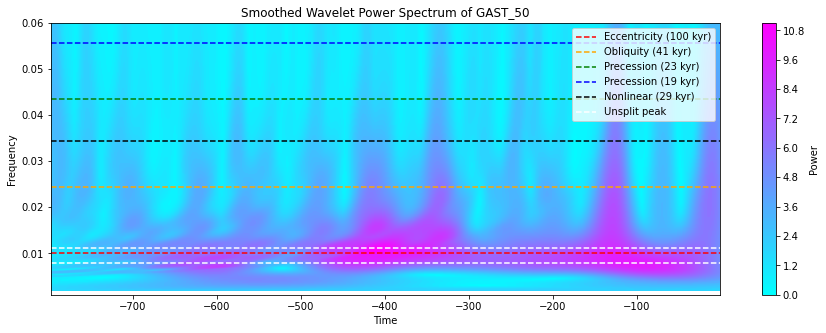

In [216]:
import pywt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from scipy.ndimage import gaussian_filter

# Assuming `iso` contains your GAST_50 data series
# Perform Continuous Wavelet Transform
iso_detrended = signal.detrend(iso)
scales = np.arange(1, 256)
coefficients, frequencies = pywt.cwt(iso_detrended, scales, 'cmor')

# Apply smoothing to the wavelet power spectrum coefficients
smoothed_coefficients = gaussian_filter(np.abs(coefficients), sigma=2)

# Plot the smoothed wavelet power spectrum using contourf
plt.figure(figsize=(15, 5))
plt.contourf(np.arange(len(iso))-len(iso), frequencies, smoothed_coefficients, 100, cmap='cool')
plt.colorbar(label='Power')
plt.axhline(y=1./100., color='red', linestyle='--', label='Eccentricity (100 kyr)')
plt.axhline(y=1./41., color='orange', linestyle='--', label='Obliquity (41 kyr)')
plt.axhline(y=1./23., color='green', linestyle='--', label='Precession (23 kyr)')
plt.axhline(y=1./18., color='blue', linestyle='--', label='Precession (19 kyr)')
plt.axhline(y=1./29., color='black', linestyle='--', label='Nonlinear (29 kyr)')
plt.axhline(y=1./90., color='white', linestyle='--', label='Unsplit peak')
plt.axhline(y=1./125., color='white', linestyle='--')
plt.ylim(0.06, .001)
plt.gca().invert_yaxis()  # Invert y-axis to have higher frequencies at the bottom
plt.title('Smoothed Wavelet Power Spectrum of GAST_50')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

## Setting Up the MCMC

From the article, we can see that the periods of the Milankovich cycles are approximately 19,23,29,41,100 thousand years. While our model will actually end up fitting our periods for us, but having these numbers in mind will allow us to shorten our MCMC run by introducing good priors, which are a priori limitations on the allowed parameter values.

We can create a basic model for describing the above fluctuations as a sum of five sinusoids, which have different amplitudes and periods corresponding to roughly the Milankovich cycles. This won’t work perfectly, but will be good enough for our purposes. Our model will be of the form
$$\Delta T = a_1 \sin{\frac{2\pi t}{M_1}} + a_2 \sin{\frac{2\pi t}{M_2}} + a_3 \sin{\frac{2\pi t}{M_3}} + a_4 \sin{\frac{2\pi t}{M_4}} + a_5 \sin{\frac{2\pi t}{M_5}} + T_0$$
with $a_i$, $p_i$ and $T_0$ the paremeters we'll be fitting for


We will be creating four functions for this MCMC run. The first is straightforward, and is known as the model. The model function should take as an argument a list representing our θ vector, and return the model evaluated at that θ. For completion, your model function should also have your age array as an input, which here we can set to default to the age array defined above. 

In [314]:
# Assuming 'age' is defined elsewhere in your code, for now we will use icecore['YearAD']
age = icecore['YearAD']

def model_Mil(theta, age=age):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0 = theta
    model = (
        a1 * np.sin(-2 * np.pi * age / M1) +
        a2 * np.sin(-2 * np.pi * age / M2) +
        a3 * np.sin(-2 * np.pi * age / M3) +
        a4 * np.sin(-2 * np.pi * age / M4) +
        a5 * np.sin(-2 * np.pi * age / M5) +
        T0
    )
    return model

We now need a function referred to as lnlike(). This function takes as an argument theta as well as the x, y, and $y_{err}$ of your actual theta. It’s job is to return a number corresponding to how good a fit your model is to your data for a given set of parameters, weighted by the error in your data points (i.e. it is more important the fit be close to data points with small error bars than points with large error bars). We will use the following formulation to determine this number- translate it to a function in python below:
$$L_{\text{lnlike}} = - \frac{1}{2} \sum\left(\frac{y-y_{\text{model}}}{y_{\text{err}}} \right)^2$$

In [315]:
# Calculate the error as half the difference between the upper and lower bounds
icecore['Temp_err'] = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 2

# Now define the lnlike function using this error
def lnlike_Mil(theta, x, y, yerr):
    y_model = model(theta, x)
    ln_like = -0.5 * np.sum(((y - y_model) / yerr) ** 2)
    return ln_like

The next function we need is one to check, before running the probability function (last one defined) on any set of parameters, that all variables are within their priors (in fact, this is where we set our priors).

The output of this function is totally arbitrary (it is just encoding True False), but emcee asks that if all priors are satisfied, 0.0 is returned, otherwise return -np.inf. Its input is a θ vector.

We set up an lnprior function that specifies bounds on $a_1, a_2, a_3,a_4,a_5$ $p_1, p_2, p_3,p_4,p_5$ $T_0$

Reasonable bounds on the amplitudes can be drawn from the plot above (the amplitudes individually can’t be greater than the overall amplitude of the final fluctuations, and $T_0$ must be within the upper and lower bounds of the data we see). Priors on the periods are tricker, I suggest going for around ten thousand years around the known Milankovich cycle periods given above- we expect the values to be close to these. (We will talk a bit later about evaluating from “walker plots” whether our priors might not have been great).

In [316]:
def lnprior_Mil(theta):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0 = theta
    
    # Define amplitude priors based on observed data
    amp_min, amp_max = 0, 10  # Adjust based on observed temperature fluctuation range
    
    # Define period priors around known Milankovitch cycle periods
    M1_min, M1_max = 18, 28  # around 23,000 years
    M2_min, M2_max = 25, 33  # around 29,000 years
    M3_min, M3_max = 35, 50  # around 41,000 years
    M4_min, M4_max = 80, 120  # around 100,000 years
    M5_min, M5_max = 15, 25  # around 19,000 years
    
    # Define T0 priors based on the range of temperature data
    T0_min = icecore['GAST_2.5'].min()
    T0_max = icecore['GAST_97.5'].max()
    
    # Check if parameters are within the specified bounds
    if (amp_min < a1 < amp_max and amp_min < a2 < amp_max and amp_min < a3 < amp_max and 
        amp_min < a4 < amp_max and amp_min < a5 < amp_max and
        M1_min < M1 < M1_max and M2_min < M2 < M2_max and M3_min < M3 < M3_max and
        M4_min < M4 < M4_max and M5_min < M5 < M5_max and
        T0_min < T0 < T0_max):
        return 0.0
    
    return -np.inf

The last function we need to define is lnprob(). This function combines the steps above by running the lnprior function, and if the function returned -np.inf, passing that through as a return, and if not (if all priors are good), returning the lnlike for that model (by convention we say it’s the lnprior output + lnlike output, since lnprior’s output should be zero if the priors are good). lnprob needs to take as arguments theta, x, y, and $y_{\text{err}}$, since these get passed through to lnlike.

In [317]:
# Define the log-probability function
def lnprob_Mil(theta, x, y, yerr):
    lp = lnprior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr)

# Example usage
age = icecore['YearAD']
temp = icecore['GAST_50']
yerr = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 4  # Rough estimate of 1 sigma error

# Initial guess for parameters
initial = [1, 1, 1, 1, 1, 23, 29, 41, 100, 19, 0]

# Check log-prior and log-probability
log_prior = lnprior(initial)
log_prob = lnprob(initial, age, temp, yerr)

print(f'Log-Prior: {log_prior}')
print(f'Log-Probability: {log_prob}')

Log-Prior: 0.0
Log-Probability: -4753.68672252497


Running production...


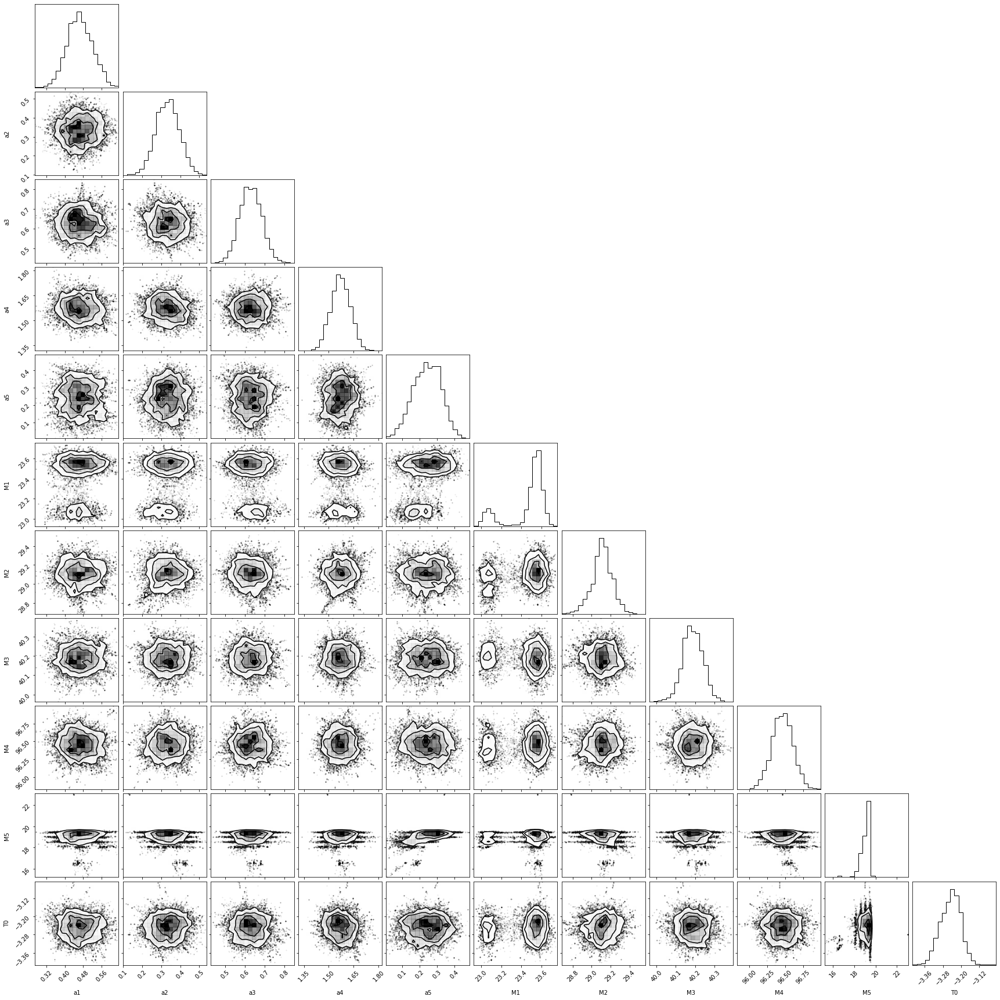

In [318]:
# Define error Terr
Terr = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 4  # Rough estimate of 1 sigma error

# Set data tuple
data = (icecore['YearAD'], icecore['GAST_50'], Terr)

# Set number of walkers and iterations
nwalkers = 50  # Number of walkers
niter = 1000  # Number of iterations

# Initial guess for parameters
initial = np.array([1.0, 1.0, 1.0, 1.0, 1.0, 23, 29, 41, 100, 19, 0.0])

# Optimize initial guess using scipy
result = minimize(lambda *args: -lnlike(*args), initial, args=data, method='L-BFGS-B')
initial_opt = result.x

# Number of dimensions
ndim = len(initial_opt)

# Initialize walkers around the initial optimized guess
p0 = [initial_opt + 1e-4 * np.random.randn(ndim) for i in range(nwalkers)]

# Run MCMC
sampler_Mil = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=data)

# Sample the parameter space
print("Running production...")
sampler_Mil.run_mcmc(p0, niter)

# Extract the samples
samples_Mil = sampler_Mil.chain[:, 200:, :].reshape((-1, ndim))

# Plot the corner plot
fig = corner.corner(samples_Mil, labels=["a1", "a2", "a3", "a4", "a5", "M1", "M2", "M3", "M4", "M5", "T0"])
plt.show()

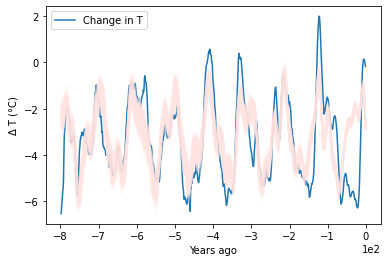

In [319]:
import numpy as np
import matplotlib.pyplot as plt

def plotter(sampler, age, T):
    # Ensure interactive mode is on
    plt.ion()
    
    # Plot the original data
    plt.plot(age, T, label='Change in T')
    
    # Get the flattened chain of samples
    try:
        samples = sampler.get_chain(flat=True)
    except AttributeError:
        samples = sampler.flatchain
    
    # Plot the model for random samples
    for theta in samples[np.random.randint(len(samples), size=100)]:
        plt.plot(age, model(theta, age), color="mistyrose", alpha=0.1)
    
    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.legend()
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter(sampler_Mil, icecore['YearAD'], icecore['GAST_50'])

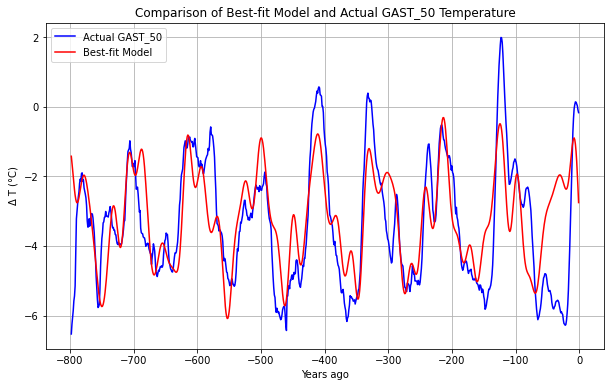

In [320]:
# Extract the best-fit parameters
best_fit_params = samples_Mil[np.argmax(lnprob_Mil)]
params_2 = np.percentile(samples_Mil, 2.5, axis=0)
params_97 = np.percentile(samples_Mil, 97.5, axis=0)

# Calculate the model values using the best-fit parameters
best_fit_model = model_Mil(best_fit_params, age)

# Plot the actual GAST_50 temperature data and the best-fit model
plt.figure(figsize=(10, 6))
plt.plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
plt.plot(age, best_fit_model, label='Best-fit Model', color='red')
plt.xlabel('Years ago')
plt.ylabel(r'$\Delta$ T (°C)')
plt.legend()
plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature')
plt.grid(True)
plt.show()

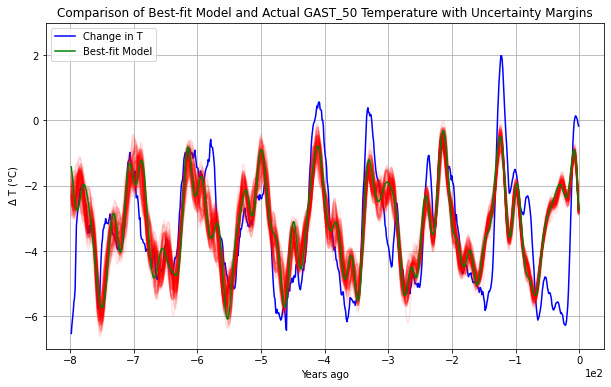

In [321]:
def plotter(sampler, age, T, best_fit_model):
    plt.figure(figsize=(10, 6))  # Adjust width and height as needed
    # Ensure interactive mode is on
    plt.ion()

    # Plot the actual data
    plt.plot(age, T, label='Change in T', color='blue')
    
    
    # Get the flattened chain of samples
    try:
        samples = sampler.get_chain(flat=True)
    except AttributeError:
        samples = sampler.flatchain
    
    # Plot the model for random samples
    for theta in samples[np.random.randint(len(samples), size=100)]:
        plt.plot(age, model_Mil(theta, age), color="red", alpha=0.1)
    
    # Plot the best-fit model
    plt.plot(age, best_fit_model, label='Best-fit Model', color='green')

    # Calculate the percentiles for uncertainty margins
    #percentiles = np.percentile(samples, [16, 84], axis=0)

    # Extract the lower and upper bounds of uncertainty margins
    #lower_bound = percentiles[0]
    #upper_bound = percentiles[1]
    
    # Shade the area representing uncertainty margins
    plt.fill_between(age, model_Mil(params_2, age), model_Mil(params_97, age), color='mistyrose', alpha=0.3)

    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.ylim(-7, 3)
    plt.legend()
    plt.grid(True)
    plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature with Uncertainty Margins')
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter(sampler_Mil, icecore['YearAD'], icecore['GAST_50'], best_fit_model)


# Incorporating CO2 in the model

The updated model looks like that, using Hansen formula:
$$\Delta T = a_1 \sin{\frac{2\pi t}{p_1}} + a_2 \sin{\frac{2\pi t}{p_2}} + a_3 \sin{\frac{2\pi t}{p_3}} + a_4 \sin{\frac{2\pi t}{p_4}} + a_5 \sin{\frac{2\pi t}{p_5}} + b_{\text{CO2}} \text{Hansen}({CO2}_{\text{ppm}}(t)) + T_0$$

In [273]:
def gelman_rubin(sampler):
    """
    Compute the Gelman-Rubin statistic (R-hat) for each parameter.

    Parameters:
        chains (numpy.ndarray): Array containing the MCMC chains with shape (nwalkers, nsteps, ndim).

    Returns:
        r_hat (numpy.ndarray): Array of R-hat values for each parameter.
    """
    chains = sampler.chain
    
    # Get the number of chains, steps, and dimensions
    n_chains, n_steps, n_dim = chains.shape

    # Compute the within-chain variance for each parameter
    w = np.mean(np.var(chains, axis=1, ddof=1), axis=0)

    # Compute the between-chain variance for each parameter
    theta_bar = np.mean(chains, axis=1)
    b = n_steps / (n_chains - 1) * np.sum((theta_bar - np.mean(theta_bar, axis=0))**2, axis=0)

    # Estimate the variance of the posterior distribution
    var_post = (n_steps - 1) / n_steps * w + 1 / n_steps * b

    # Compute the potential scale reduction factor (R-hat)
    r_hat = np.sqrt(var_post / w)
    
    # Print or plot R-hat values for each parameter
    print("Gelman-Rubin statistic (R-hat):")
    for i, r_hat_ in enumerate(r_hat):
        print(f"Parameter {i}: R-hat = {r_hat_}")

    # Plot trace plots for visual inspection of convergence
    plt.figure(figsize=(10, 6))
    for i in range(chains.shape[2]):
        plt.subplot(chains.shape[2], 1, i + 1)
        for j in range(chains.shape[0]):
            plt.plot(chains[j, :, i], alpha=0.5)
        plt.xlabel('Iteration')
        plt.ylabel(f'Parameter {i}')
    plt.tight_layout()
    plt.show()

In [274]:
x_0 = 315
f_CO2_0 = np.log(1+1.2*x_0+0.005*x_0 **2+1.4*10**-6 *x_0 **3)

def impact_of_co2_on_delta_t(x):
    return np.log(1+1.2*x+0.005*x **2+1.4*10**-6 *x **3)-f_CO2_0

Running production...
Computing Gelman-Rubin statistic
Gelman-Rubin statistic (R-hat):
Parameter 0: R-hat = 1.265548461182754
Parameter 1: R-hat = 1.1662203171772518
Parameter 2: R-hat = 1.5790031306435535
Parameter 3: R-hat = 1.2373280264655433
Parameter 4: R-hat = 1.239105236139515
Parameter 5: R-hat = 1.4395489956371224
Parameter 6: R-hat = 1.2990785867436816
Parameter 7: R-hat = 1.7373830821169414
Parameter 8: R-hat = 1.2439224352314682
Parameter 9: R-hat = 1.1139231409213812
Parameter 10: R-hat = 1.2832839828063827
Parameter 11: R-hat = 1.2646420011389305


/var/folders/m6/ccwcjwwd0g15gz1jkngbspqw0000gn/T/ipykernel_33409/2849728666.py:42: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


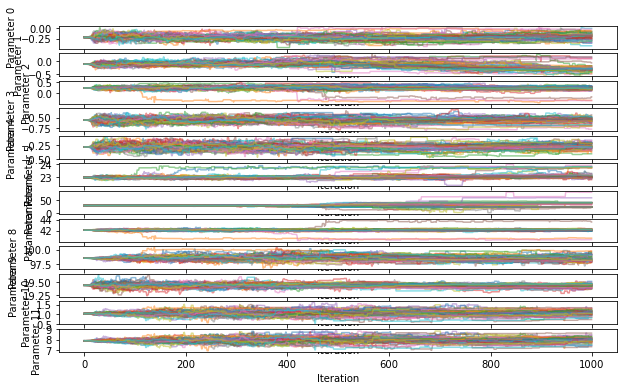

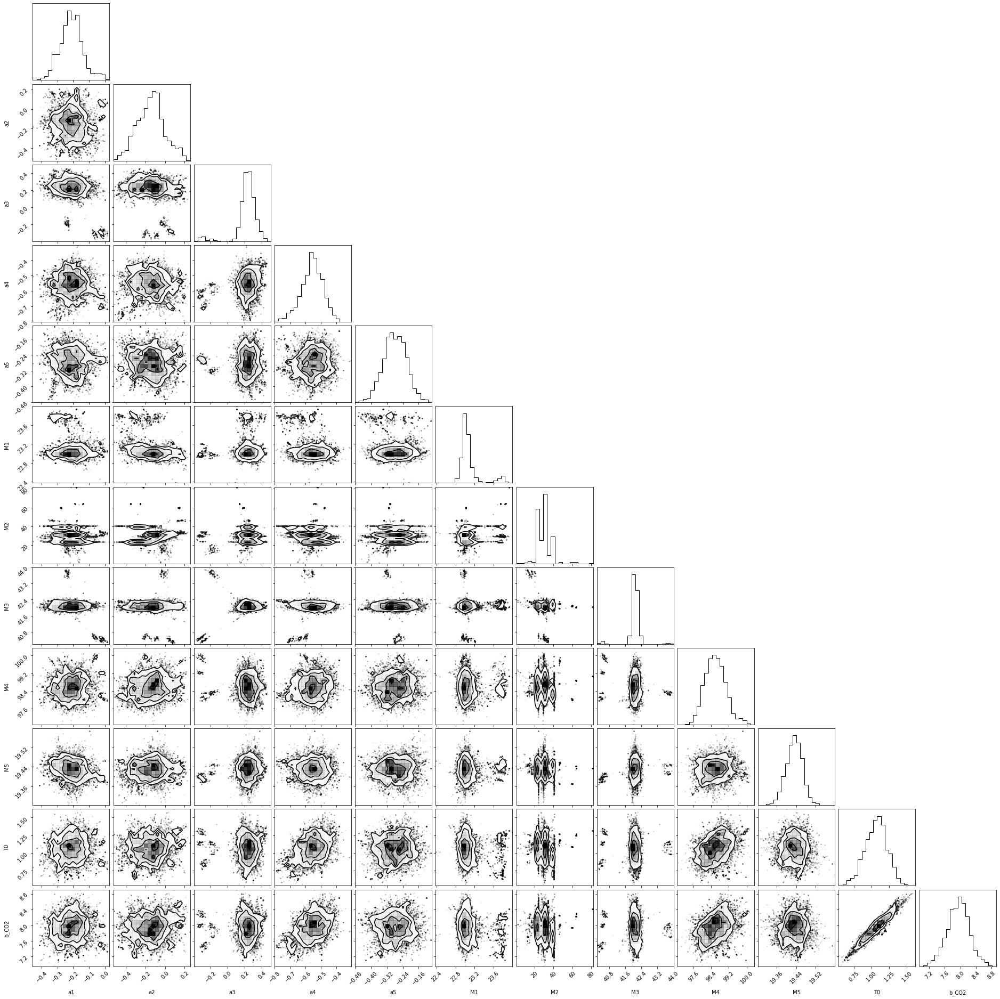

In [275]:
def model_with_co2(theta, age, Hansen):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0, b_CO2 = theta
    
    # Model without CO2
    model = a1 * np.sin(2 * np.pi * age / M1) + a2 * np.sin(2 * np.pi * age / M2) + \
            a3 * np.sin(2 * np.pi * age / M3) + a4 * np.sin(2 * np.pi * age / M4) + \
            a5 * np.sin(2 * np.pi * age / M5) + T0
    
    # Add corrections for CO2 from Hansen paper
    model += b_CO2 * Hansen
    
    return model

def lnlike_with_co2(theta, age, T, Terr, Hansen):
    model_values = model_with_co2(theta, age, Hansen)
    residual = T - model_values
    lnlike = -0.5 * np.sum((residual / Terr) ** 2)
    return lnlike

def lnprior_with_co2(theta):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0, b_CO2 = theta
    
    # Priors on parameters a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, and T0
    if (-7 < a1 < 3) and (-7 < a2 < 3) and (-7 < a3 < 3) and (-7 < a4 < 3) and (-7 < a5 < 3) and (0 < M1) and \
       (0 < M2) and (0 < M3) and (0 < M4) and (0 < M5) and (-10 < T0 < 10):
        # Priors on CO2 and CH4
        if -1000 < b_CO2 < 1000:
            return 0.0
    return -np.inf

def lnprob_with_co2(theta, age, T, Terr, Hansen):
    lp = lnprior_with_co2(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike_with_co2(theta, age, T, Terr, Hansen)

# Define Computed things
Terr = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 4
icecore['Hansen_CO2_formula'] = impact_of_co2_on_delta_t(icecore['CO2ppm'])

#Set data tuple including CO2
data = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'])

# Set number of walkers and iterations
nwalkers = 50  # Number of walkers
niter = 1000  # Number of iterations

# Initial guess for parameters
initial = np.array([1.0, 1.0, 1.0, 1.0, 1.0, 23, 29, 41, 100, 19, 0.0, 0.0])

# Optimize initial guess using scipy
result = minimize(lambda *args: -lnlike_with_co2(*args), initial, args=data, method='L-BFGS-B')
initial_opt = result.x

# Number of dimensions
ndim = len(initial_opt)

# Initialize walkers around the initial optimized guess
p0 = [initial_opt + 1e-4 * np.random.randn(ndim) for i in range(nwalkers)]

# Run MCMC
sampler_co2 = emcee.EnsembleSampler(nwalkers, ndim, lnprob_with_co2, args=data)

# Sample the parameter space
print("Running production...")
sampler_co2.run_mcmc(p0, niter)

# Extract the samples_co2
samples_co2 = sampler_co2.chain[:, 200:, :].reshape((-1, ndim))

# Check convergence using Gelman-Rubin statistic
print("Computing Gelman-Rubin statistic")
gelman_rubin(sampler_co2)

# Plot the corner plot
fig = corner.corner(samples_co2, labels=["a1", "a2", "a3", "a4", "a5", "M1", "M2", "M3", "M4", "M5", "T0", "b_CO2"])
plt.show()

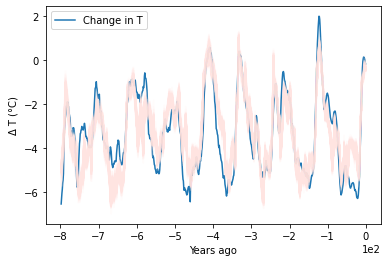

In [22]:
def plotter_CO2(sampler_co2, age, T, Hansen, model, n_samples_co2=100):
    # Ensure interactive mode is on
    plt.ion()
    
    # Plot the original data
    plt.plot(age, T, label='Change in T')
    
    # Get the flattened chain of samples_co2
    try:
        samples_co2 = sampler_co2.get_chain(flat=True)
    except AttributeError:
        samples_co2 = sampler_co2.flatchain
    
    # Plot the model for random samples_co2
    for theta in samples_co2[np.random.randint(len(samples_co2), size=n_samples_co2)]:
        plt.plot(age, model(theta, age, Hansen), color="mistyrose", alpha=0.1)
    
    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.legend()
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter_CO2(sampler_co2, icecore['YearAD'], icecore['GAST_50'], icecore['Hansen_CO2_formula'], model_with_co2)


[-0.21425965 -0.14044725  0.23356189 -0.55534503 -0.28182295 23.02099916
 29.20437716 42.07599867 98.57124088 19.43105021  1.06625792  7.9461206 ]


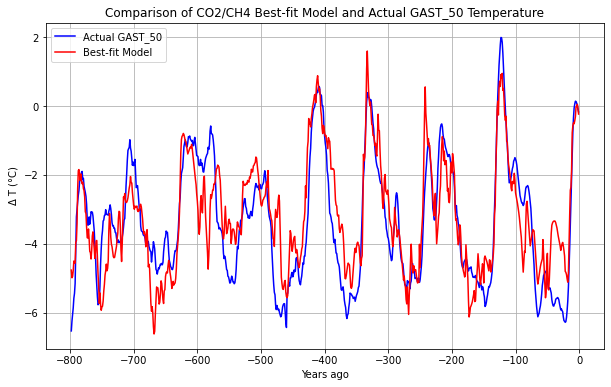

In [340]:
# Extract the best-fit parameters
best_fit_params = samples_co2[np.argmax(lnprob_with_co2)]

# Calculate the model values using the best-fit parameters
best_fit_model = model_with_co2(best_fit_params, age, icecore['Hansen_CO2_formula'])

print(np.median(samples_co2, axis=0))
# Plot the actual GAST_50 temperature data and the best-fit model
plt.figure(figsize=(10, 6))
plt.plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
plt.plot(age, best_fit_model, label='Best-fit Model', color='red')
# Shade the area representing uncertainty margins
plt.xlabel('Years ago')
plt.ylabel(r'$\Delta$ T (°C)')
plt.legend()
plt.title('Comparison of CO2/CH4 Best-fit Model and Actual GAST_50 Temperature')
plt.grid(True)
plt.show()

[-0.21425965 -0.14044725  0.23356189 -0.55534503 -0.28182295 23.02099916
 29.20437716 42.07599867 98.57124088 19.43105021  1.06625792  7.9461206 ]


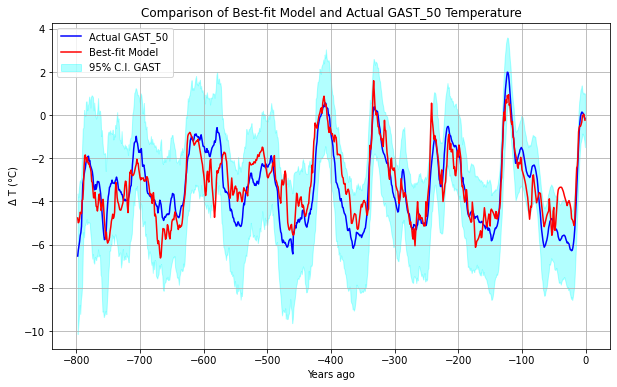

In [338]:
# Extract the best-fit parameters
best_fit_params = samples_co2[np.argmax(lnprob_with_co2)]

# Calculate the model values using the best-fit parameters
best_fit_model = model_with_co2(best_fit_params, age, icecore['Hansen_CO2_formula'])

print(np.median(samples_co2, axis=0))
# Plot the actual GAST_50 temperature data and the best-fit model
plt.figure(figsize=(10, 6))
plt.plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
plt.plot(age, best_fit_model, label='Best-fit Model', color='red')
# Shade the area representing uncertainty margins
plt.fill_between(age, icecore['GAST_2.5'], icecore['GAST_97.5'], label='95% C.I. GAST', color='cyan', alpha=0.3)
plt.xlabel('Years ago')
plt.ylabel(r'$\Delta$ T (°C)')
plt.legend()
plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature')
plt.grid(True)
plt.show()

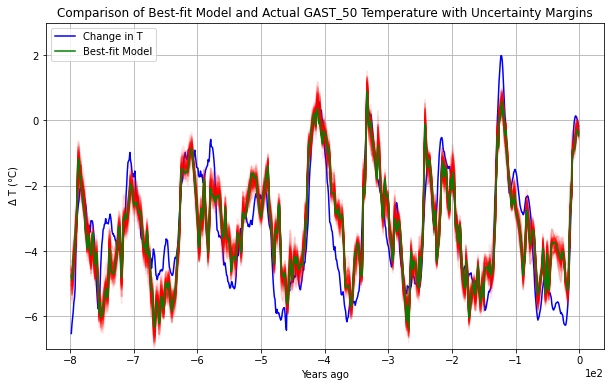

In [276]:
def plotter_CO2(sampler_co2, age, T, Hansen, best_fit_model):
    plt.figure(figsize=(10, 6))  # Adjust width and height as needed
    # Ensure interactive mode is on
    plt.ion()

    # Plot the actual data
    plt.plot(age, T, label='Change in T', color='blue')
    
    # Get the flattened chain of samples_co2
    try:
        samples_co2 = sampler_co2.get_chain(flat=True)
    except AttributeError:
        samples_co2 = sampler_co2.flatchain
    
    # Plot the model for random samples_co2
    for theta in samples_co2[np.random.randint(len(samples_co2), size=100)]:
        plt.plot(age, model_with_co2(theta, age, Hansen), color="red", alpha=0.1)
    
    # Plot the best-fit model
    plt.plot(age, best_fit_model, label='Best-fit Model', color='green')
    
    # Calculate the percentiles for uncertainty margins
    percentiles = np.percentile(samples_co2, [16, 84], axis=0)

    # Extract the lower and upper bounds of uncertainty margins
    lower_bound = percentiles[0]
    upper_bound = percentiles[1]

    # Shade the area representing uncertainty margins
    plt.fill_between(age, lower_bound[5], upper_bound[5], color='lavenderblush', alpha=0.3)

    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.ylim(-7, 3)
    plt.legend()
    plt.grid(True)
    plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature with Uncertainty Margins')
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter_CO2(sampler_co2, icecore['YearAD'], icecore['GAST_50'], icecore['Hansen_CO2_formula'], best_fit_model)

## Incorporating CH4 in the model

The updated model looks like that, using Hansen formula:
$$\Delta T = a_1 \sin{\frac{2\pi t}{p_1}} + a_2 \sin{\frac{2\pi t}{p_2}} + a_3 \sin{\frac{2\pi t}{p_3}} + a_4 \sin{\frac{2\pi t}{p_4}} + a_5 \sin{\frac{2\pi t}{p_5}} + b_{\text{CO2}} \text{Hansen_CO2}({\text{CO2}}_{\text{ppm}}(t)) + b_{\text{CH4}} \text{Hansen_CH4}({\text{CH4}}_{\text{ppb}}(t))+ T_0$$

We take refernce amounts as pre-industrial since done equally for CO2
Source of reference amounts: https://community.wmo.int/en/wmo-greenhouse-gas-bulletin-14#:~:text=*%20Assuming%20a%20pre%2Dindustrial%20mole,and%20270%20ppb%20for%20N2O.

In [284]:
#Formula of Hansen for CH4
x0=0.720 #Pre-industrial CH4 amount ppm
y0=0.270 #Pre-industrial N20 amount ppb

def g(x, y):
    return (
        (0.394 * x**0.66 + 0.16*x*np.exp(-1.6*x)) / (1 + 0.169 * x**0.62)
        + 1.556 * np.log(1 + y**0.77 * (109.8 + 3.5*y) / (100 + 0.14 * y**2))
        - 0.014 * np.log(1 + 0.636 * (x*y)**0.75 + 0.007*x*(x*y)**1.52)
    )

def impact_of_ch4_on_delta_t(x):
    return g(x, y0) - g(x0, y0)

Running production...
Computing Gelman-Rubin statistic
Gelman-Rubin statistic (R-hat):
Parameter 0: R-hat = 1.2824342493060905
Parameter 1: R-hat = 1.2759043652298132
Parameter 2: R-hat = 1.3493279716365885
Parameter 3: R-hat = 1.1790295582670363
Parameter 4: R-hat = 1.321851533245274
Parameter 5: R-hat = 1.6545007132053857
Parameter 6: R-hat = 1.30122237781209
Parameter 7: R-hat = 1.5405597906236275
Parameter 8: R-hat = 1.2099832390067866
Parameter 9: R-hat = 1.6473899383970227
Parameter 10: R-hat = 1.2593762128192867
Parameter 11: R-hat = 1.2872970739090928
Parameter 12: R-hat = 1.2760614668357713


/var/folders/m6/ccwcjwwd0g15gz1jkngbspqw0000gn/T/ipykernel_33409/2849728666.py:42: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


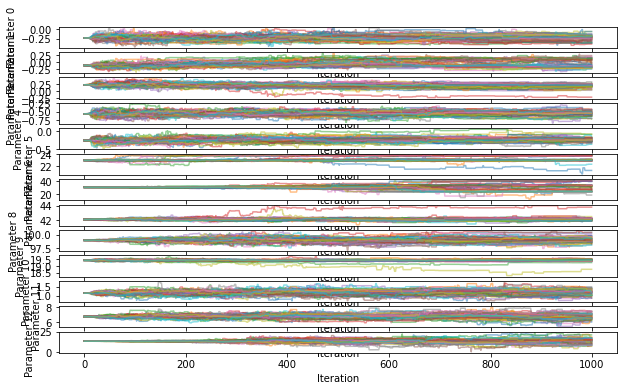

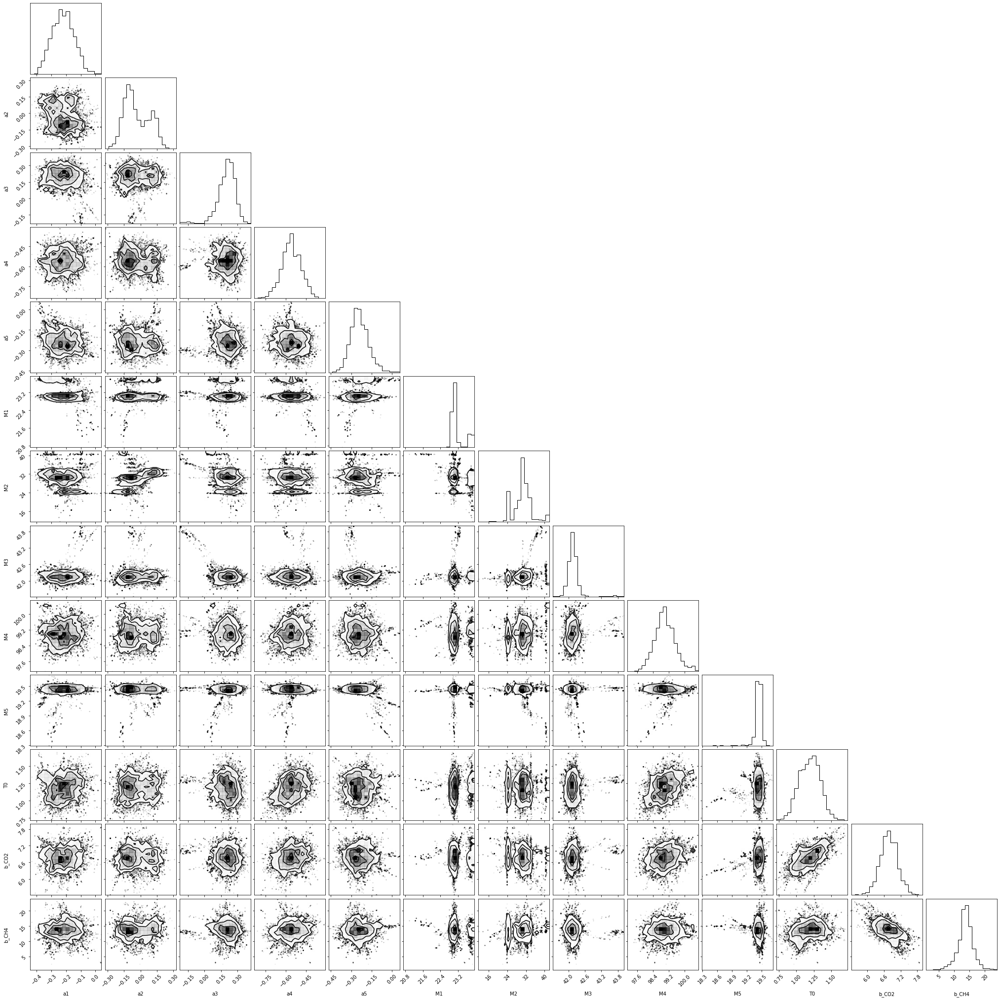

In [285]:
def model_with_gases(theta, age, Hansen_CO2, Hansen_CH4):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0, b_CO2, b_CH4 = theta
    
    # Model without CO2
    model = a1 * np.sin(2 * np.pi * age / M1) + a2 * np.sin(2 * np.pi * age / M2) + \
            a3 * np.sin(2 * np.pi * age / M3) + a4 * np.sin(2 * np.pi * age / M4) + \
            a5 * np.sin(2 * np.pi * age / M5) + T0
    
    # Add corrections for CO2 from Hansen paper
    model += b_CO2 * Hansen_CO2 + b_CH4 * Hansen_CH4
    
    return model

def lnlike_with_gases(theta, age, T, Terr, Hansen_CO2, Hansen_CH4):
    model_values = model_with_gases(theta, age, Hansen_CO2, Hansen_CH4)
    residual = T - model_values
    lnlike = -0.5 * np.sum((residual / Terr) ** 2)
    return lnlike

def lnprior_with_gases(theta):
    a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, T0, b_CO2, b_CH4 = theta
    
    # Priors on parameters a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, and T0
    if (-7 < a1 < 3) and (-7 < a2 < 3) and (-7 < a3 < 3) and (-7 < a4 < 3) and (-7 < a5 < 3) and (0 < M1) and \
       (0 < M2) and (0 < M3) and (0 < M4) and (0 < M5) and (-10 < T0 < 10):
        # Priors on CO2 and CH4
        if -1000 < b_CO2 < 1000 and -1000 < b_CH4 < 1000:
            return 0.0
    return -np.inf

def lnprob_with_gases(theta, age, T, Terr, Hansen_CO2, Hansen_CH4):
    lp = lnprior_with_gases(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike_with_gases(theta, age, T, Terr, Hansen_CO2, Hansen_CH4)

# Define Computed things
Terr = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 4
icecore['Hansen_CO2_formula'] = impact_of_co2_on_delta_t(icecore['CO2ppm'])
icecore['Hansen_CH4_formula'] = impact_of_ch4_on_delta_t(icecore['CH4ppb']/1000)

#Set data tuple including CO2
data = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'])

# Set number of walkers and iterations
nwalkers = 50  # Number of walkers
niter = 1000  # Number of iterations

# Initial guess for parameters
initial = np.array([1.0, 1.0, 1.0, 1.0, 1.0, 23, 29, 41, 100, 19, 0.0, 0.0, 0.0])

# Optimize initial guess using scipy
result = minimize(lambda *args: -lnlike_with_gases(*args), initial, args=data, method='L-BFGS-B')
initial_opt = result.x

# Number of dimensions
ndim = len(initial_opt)

# Initialize walkers around the initial optimized guess
p0 = [initial_opt + 1e-4 * np.random.randn(ndim) for i in range(nwalkers)]

# Run MCMC
sampler_gases = emcee.EnsembleSampler(nwalkers, ndim, lnprob_with_gases, args=data)

# Sample the parameter space
print("Running production...")
sampler_gases.run_mcmc(p0, niter)

# Extract the samples_gases
samples_gases = sampler_gases.chain[:, 200:, :].reshape((-1, ndim))

# Check convergence using Gelman-Rubin statistic
print("Computing Gelman-Rubin statistic")
gelman_rubin(sampler_gases)

# Plot the corner plot
fig = corner.corner(samples_gases, labels=["a1", "a2", "a3", "a4", "a5", "M1", "M2", "M3", "M4", "M5", "T0", "b_CO2", "b_CH4"])
plt.show()

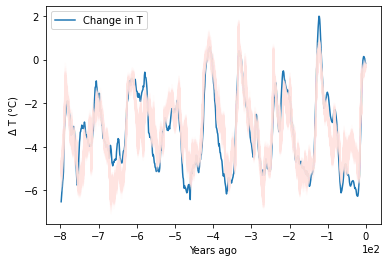

In [286]:
def plotter_gases(sampler_gases, age, T, Hansen_CO2, Hansen_CH4, model, n_samples_gases=100):
    # Ensure interactive mode is on
    plt.ion()
    
    # Plot the original data
    plt.plot(age, T, label='Change in T')
    
    # Get the flattened chain of samples_gases
    try:
        samples_gases = sampler_gases.get_chain(flat=True)
    except AttributeError:
        samples_gases = sampler_gases.flatchain
    
    # Plot the model for random samples_gases
    for theta in samples_gases[np.random.randint(len(samples_gases), size=n_samples_gases)]:
        plt.plot(age, model(theta, age, Hansen_CO2, Hansen_CH4), color="mistyrose", alpha=0.1)
    
    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.legend()
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter_gases(sampler_gases, icecore['YearAD'], icecore['GAST_50'], icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'], model_with_gases)


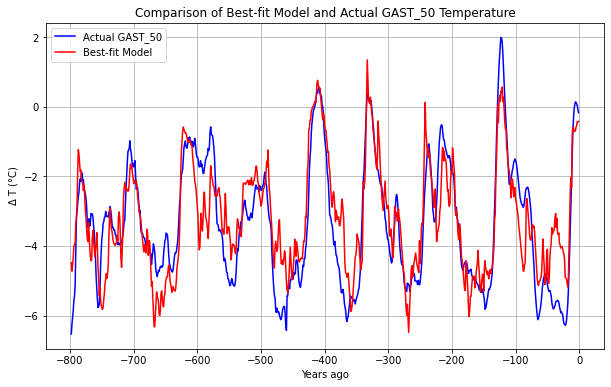

In [287]:
# Extract the best-fit parameters
best_fit_params = samples_gases[np.argmax(lnprob_with_gases)]

# Calculate the model values using the best-fit parameters
best_fit_model = model_with_gases(best_fit_params, age, icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'])

# Plot the actual GAST_50 temperature data and the best-fit model
plt.figure(figsize=(10, 6))
plt.plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
plt.plot(age, best_fit_model, label='Best-fit Model', color='red')
plt.xlabel('Years ago')
plt.ylabel(r'$\Delta$ T (°C)')
plt.legend()
plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature')
plt.grid(True)
plt.show()

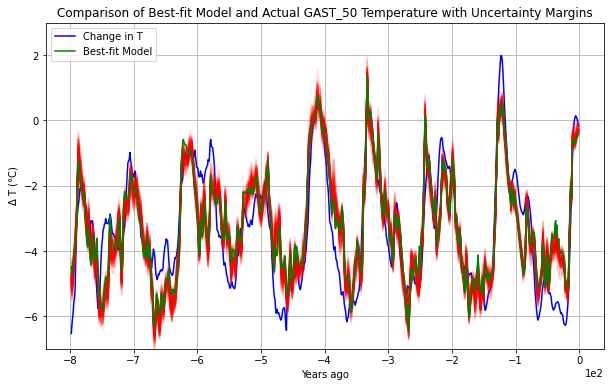

In [288]:
def plotter_gases(sampler_gases, age, T, Hansen_CO2, Hansen_CH4, best_fit_model):
    plt.figure(figsize=(10, 6))  # Adjust width and height as needed
    # Ensure interactive mode is on
    plt.ion()

    # Plot the actual data
    plt.plot(age, T, label='Change in T', color='blue')
    
    
    # Get the flattened chain of samples_gases
    try:
        samples_gases = sampler_gases.get_chain(flat=True)
    except AttributeError:
        samples_gases = sampler_gases.flatchain
    
    # Plot the model for random samples_gases
    for theta in samples_gases[np.random.randint(len(samples_gases), size=100)]:
        plt.plot(age, model_with_gases(theta, age, Hansen_CO2, Hansen_CH4), color="red", alpha=0.1)
    
    # Plot the best-fit model
    plt.plot(age, best_fit_model, label='Best-fit Model', color='green')
    
    # Calculate the percentiles for uncertainty margins
    percentiles = np.percentile(samples_gases, [16, 84], axis=0)

    # Extract the lower and upper bounds of uncertainty margins
    lower_bound = percentiles[0]
    upper_bound = percentiles[1]

    # Shade the area representing uncertainty margins
    plt.fill_between(age, lower_bound[5], upper_bound[5], color='lavenderblush', alpha=0.3)

    # Format the plot
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.xlabel('Years ago')
    plt.ylabel(r'$\Delta$ T (°C)')
    plt.ylim(-7, 3)
    plt.legend()
    plt.grid(True)
    plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature with Uncertainty Margins')
    plt.show()

# Example usage (assuming the MCMC has been run successfully)
plotter_gases(sampler_gases, icecore['YearAD'], icecore['GAST_50'], icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'], best_fit_model)

### Testing Model without 29kyr cycle 

Running production...
Computing Gelman-Rubin statistic
Gelman-Rubin statistic (R-hat):
Parameter 0: R-hat = 1.082698678408819
Parameter 1: R-hat = 1.1201364779310345
Parameter 2: R-hat = 1.1361991707839456
Parameter 3: R-hat = 1.2202318059762352
Parameter 4: R-hat = 1.6256933906587454
Parameter 5: R-hat = 1.0843979221301416
Parameter 6: R-hat = 1.1976952969060988
Parameter 7: R-hat = 1.6288499752127419
Parameter 8: R-hat = 1.1302468245403343
Parameter 9: R-hat = 1.130188328454593


/var/folders/m6/ccwcjwwd0g15gz1jkngbspqw0000gn/T/ipykernel_33409/2849728666.py:42: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


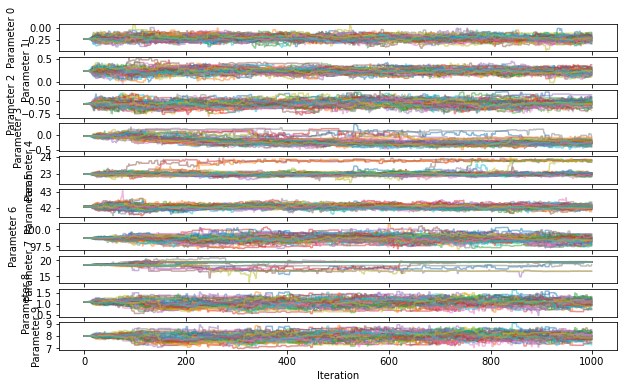

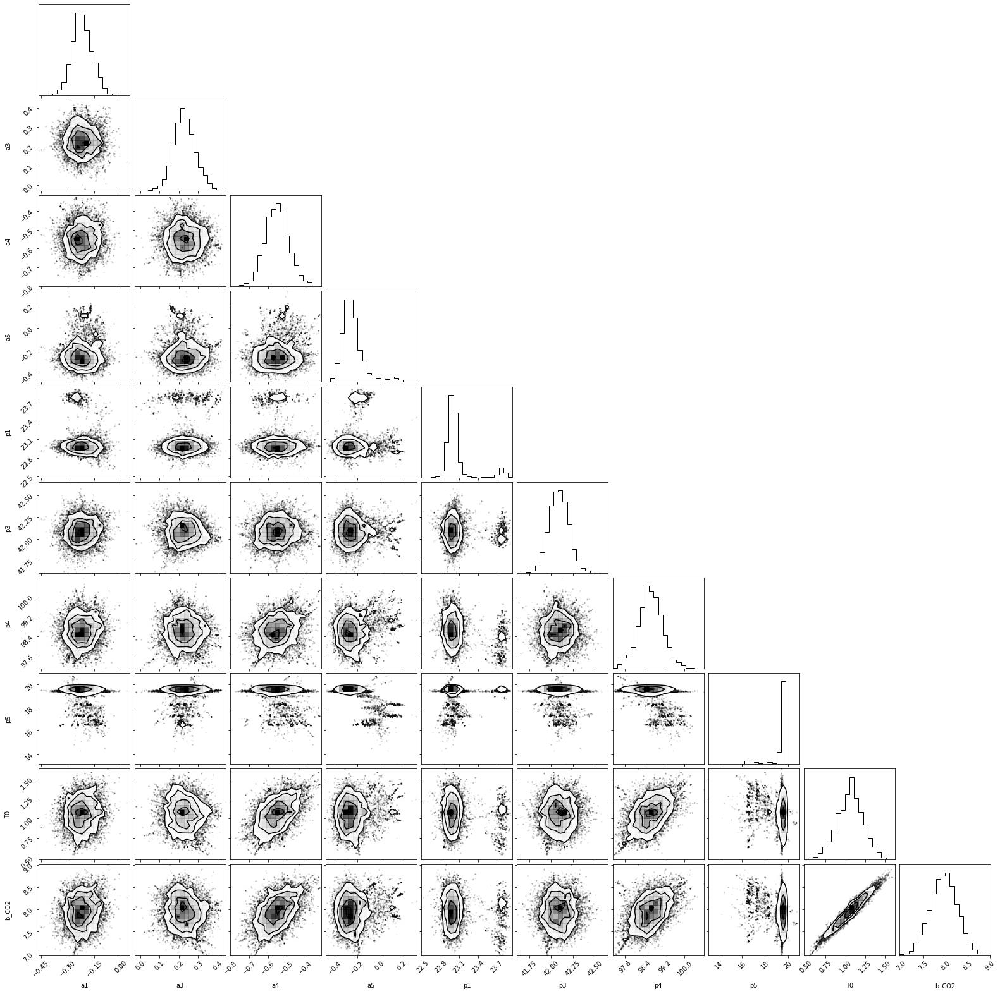

In [59]:
def model_no29(theta, age, Hansen):
    a1, a3, a4, a5, M1, M3, M4, M5, T0, b_CO2 = theta
    
    # Model without CO2
    model = a1 * np.sin(2 * np.pi * age / M1) + a5 * np.sin(2 * np.pi * age / M5) + \
            a3 * np.sin(2 * np.pi * age / M3) + a4 * np.sin(2 * np.pi * age / M4) + \
            + T0
    
    # Add corrections for CO2 from Hansen paper
    model += b_CO2 * Hansen
    
    return model

def lnlike_no29(theta, age, T, Terr, Hansen):
    model_values = model_no29(theta, age, Hansen)
    residual = T - model_values
    lnlike = -0.5 * np.sum((residual / Terr) ** 2)
    return lnlike

def lnprior_no29(theta):
    a1, a3, a4, a5, M1, M3, M4, M5, T0, b_CO2 = theta
    
    # Priors on parameters a1, a2, a3, a4, a5, M1, M2, M3, M4, M5, and T0
    if (-7 < a1 < 3) and (-7 < a3 < 3) and (-7 < a4 < 3) and (-7 < a5 < 3) and (0 < M1) and \
        (0 < M3) and (0 < M4) and (0 < M5) and (-10 < T0 < 10):
        # Priors on CO2 and CH4
        if -1000 < b_CO2 < 1000:
            return 0.0
    return -np.inf

def lnprob_no29(theta, age, T, Terr, Hansen):
    lp = lnprior_no29(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike_no29(theta, age, T, Terr, Hansen)

# Define Computed things
Terr = (icecore['GAST_97.5'] - icecore['GAST_2.5']) / 4
icecore['Hansen_CO2_formula'] = impact_of_co2_on_delta_t(icecore['CO2ppm'])

#Set data tuple including CO2
data = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'])

# Set number of walkers and iterations
nwalkers = 50  # Number of walkers
niter = 1000  # Number of iterations

# Initial guess for parameters
initial = np.array([1.0, 1.0, 1.0, 1.0, 23, 41, 100, 19, 0.0, 0.0])

# Optimize initial guess using scipy
result = minimize(lambda *args: -lnlike_no29(*args), initial, args=data, method='L-BFGS-B')
initial_opt = result.x

# Number of dimensions
ndim = len(initial_opt)

# Initialize walkers around the initial optimized guess
p0 = [initial_opt + 1e-4 * np.random.randn(ndim) for i in range(nwalkers)]

# Run MCMC
sampler_no29 = emcee.EnsembleSampler(nwalkers, ndim, lnprob_no29, args=data)

# Sample the parameter space
print("Running production...")
sampler_no29.run_mcmc(p0, niter)

# Extract the samples_no29
samples_no29 = sampler_no29.chain[:, 200:, :].reshape((-1, ndim))

# Check convergence using Gelman-Rubin statistic
print("Computing Gelman-Rubin statistic")
gelman_rubin(sampler_no29)

# Plot the corner plot
fig = corner.corner(samples_no29, labels=["a1", "a3", "a4", "a5", "M1", "M3", "M4", "M5", "T0", "b_CO2"])
plt.show()

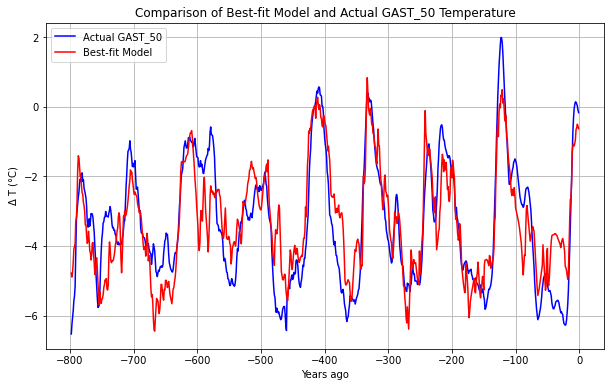

In [61]:
# Extract the best-fit parameters
best_fit_params = samples_no29[np.argmax(lnprob_no29)]

# Calculate the model values using the best-fit parameters
best_fit_model = model_no29(best_fit_params, age, icecore['Hansen_CO2_formula'])

# Plot the actual GAST_50 temperature data and the best-fit model
plt.figure(figsize=(10, 6))
plt.plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
plt.plot(age, best_fit_model, label='Best-fit Model', color='red')
plt.xlabel('Years ago')
plt.ylabel(r'$\Delta$ T (°C)')
plt.legend()
plt.title('Comparison of Best-fit Model and Actual GAST_50 Temperature')
plt.grid(True)
plt.show()

## Comparing Model with CH4 compared to Model with only CO2

In [323]:
#Define data of co2
data_Mil = (icecore['YearAD'], icecore['GAST_50'], Terr)
data_co2 = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'])
data_gases = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'])
data_no29 = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'])

# Define log-likelihood function for Milankovitch
def log_likelihood_model_Mil(data):
    age, T, Terr = data
    
    # Compute model predictions for all parameter samples_gases at once
    log_likelihoods = np.array([lnlike_Mil(theta, age, T, Terr) for theta in samples_Mil])

    # Find the minimum log-likelihood
    return log_likelihoods.max()

# Define log-likelihood function for Model CO2
def log_likelihood_model_co2(data):
    age, T, Terr, Hansen_CO2 = data
    
    # Compute model predictions for all parameter samples_gases at once
    log_likelihoods = np.array([lnlike_with_co2(theta, age, T, Terr, Hansen_CO2) for theta in samples_co2])

    # Find the minimum log-likelihood
    return log_likelihoods.max()

# Define log-likelihood function for Model CO2/CH4
def log_likelihood_model_ch4(data):
    age, T, Terr, Hansen_CO2, Hansen_CH4 = data
    
    # Compute model predictions for all parameter samples_gases at once
    log_likelihoods = np.array([lnlike_with_gases(theta, age, T, Terr, Hansen_CO2, Hansen_CH4) for theta in samples_gases])
    
    # Find the minimum log-likelihood
    return log_likelihoods.max()

# Define log-likelihood function for Model CO2 no 29
def log_likelihood_model_no29(data):
    age, T, Terr, Hansen_CO2 = data
    
    # Compute model predictions for all parameter samples_gases at once
    log_likelihoods = np.array([lnlike_no29(theta, age, T, Terr, Hansen_CO2) for theta in samples_no29])
    
    # Find the minimum log-likelihood
    return log_likelihoods.max()

# Calculate likelihood ratio statistic
print("Computing max likelihood...")
max_log_likelihood_co2 = log_likelihood_model_co2(data_co2)
print(max_log_likelihood_co2)
max_log_likelihood_gases = log_likelihood_model_ch4(data_gases)
print(max_log_likelihood_gases)
max_log_likelihood_no29 = log_likelihood_model_no29(data_no29)
print(max_log_likelihood_no29)
max_log_likelihood_Mil = log_likelihood_model_Mil(data_Mil)
print(max_log_likelihood_Mil)

likelihood_ratio_statistic_test1 = 2 * (max_log_likelihood_co2 - max_log_likelihood_gases)
likelihood_ratio_statistic_test2 = 2 * (max_log_likelihood_gases - max_log_likelihood_no29)
likelihood_ratio_statistic_test3 = 2 * (max_log_likelihood_co2 - max_log_likelihood_no29)
likelihood_ratio_statistic_test4 = 2 * (max_log_likelihood_co2 - max_log_likelihood_Mil)
likelihood_ratio_statistic_test5 = 2 * (max_log_likelihood_gases - max_log_likelihood_Mil)


Computing max likelihood...
-281.69613316024663
-296.512107537867
-304.9815859443744
-669.837549014762


Hypothesis test...


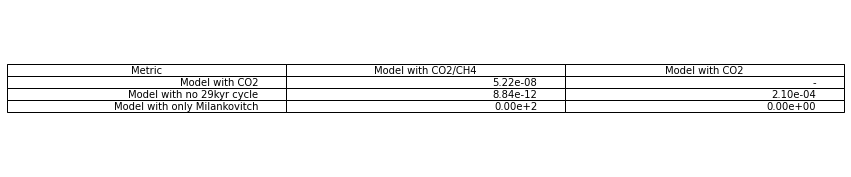

In [335]:
from decimal import Decimal
# Calculate degrees of freedom (difference in number of parameters between model 2 and model 1)
df_1 = 1
df_2 = 2
df_3 = 1
df_4 = 1
df_5 = 2

# Function to format p-values
def format_p_value(p_value):
    if p_value < 1e-3:
        return "{:.2e}".format(p_value)
    else:
        return "{:.6f}".format(p_value)

# Perform hypothesis test
print("Hypothesis test...")
p_value_1 = 1 - chi2.cdf(likelihood_ratio_statistic_test1, df_1)
p_value_2 = 1 - chi2.cdf(likelihood_ratio_statistic_test2, df_2)
p_value_3 = 1 - chi2.cdf(likelihood_ratio_statistic_test3, df_3)
p_value_4 = Decimal(1 - chi2.cdf(likelihood_ratio_statistic_test4, df_4))
p_value_5 = 1 - chi2.cdf(likelihood_ratio_statistic_test5, df_5)

# Format p-values
p_value_1_str = format_p_value(p_value_1)
p_value_2_str = format_p_value(p_value_2)
p_value_3_str = format_p_value(p_value_3)
p_value_4_str = format_p_value(p_value_4)
p_value_5_str = format_p_value(p_value_5)

# Create a list of lists for the table data
table_data = [
    ["Metric", "Model with CO2/CH4", "Model with CO2"],
    ["Model with CO2", p_value_1_str, "-"],
    ["Model with no 29kyr cycle", p_value_3_str, p_value_2_str],
    ["Model with only Milankovitch", p_value_4_str, p_value_5_str]
]

# Create the table using tabulate
table = tabulate(table_data[1:], headers="firstrow", tablefmt="fancy_outline")

# Plot the table as text
fig, ax = plt.subplots(figsize=(15, 3))
ax.axis('off')
ax.table(cellText=table_data[1:], colLabels=table_data[0], loc='center')

# Save the plot as an image
plt.show()



## Evaluation Test

/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 an

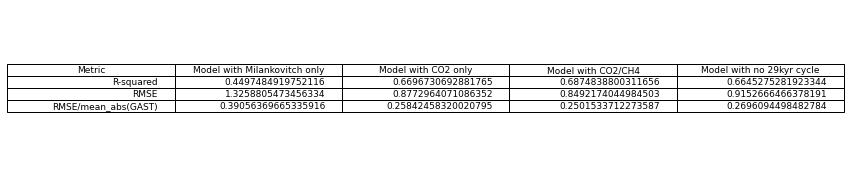

In [356]:
##Goodness-of-fit tests
from tabulate import tabulate
from sklearn.metrics import r2_score, mean_squared_error
# Compute the posterior mean of parameters
theta_opt_co2 = np.mean(samples_co2, axis=0)
theta_opt_gases = np.mean(samples_gases, axis=0)
theta_opt_no29 = np.mean(samples_no29, axis=0)
theta_opt_Mil = np.mean(samples_Mil, axis=0)

# Calculate R-squared
r_squared_co2 = r2_score(icecore['GAST_50'], model_with_co2(theta_opt_co2, icecore['YearAD'], icecore['Hansen_CO2_formula']))
r_squared_gases = r2_score(icecore['GAST_50'], model_with_gases(theta_opt_gases, icecore['YearAD'], icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula']))
r_squared_no29 = r2_score(icecore['GAST_50'], model_no29(theta_opt_no29, icecore['YearAD'], icecore['Hansen_CO2_formula']))
r_squared_Mil = r2_score(icecore['GAST_50'], model_Mil(theta_opt_Mil, icecore['YearAD']))

# Calculate RMSE
rmse_co2 = mean_squared_error(icecore['GAST_50'], model_with_co2(theta_opt_co2, icecore['YearAD'], icecore['Hansen_CO2_formula']), squared=False)
rmse_gases = mean_squared_error(icecore['GAST_50'], model_with_gases(theta_opt_gases, icecore['YearAD'], icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula']), squared=False)
rmse_no29 = mean_squared_error(icecore['GAST_50'], model_no29(theta_opt_no29, icecore['YearAD'], icecore['Hansen_CO2_formula']), squared=False)
rmse_Mil = mean_squared_error(icecore['GAST_50'], model_Mil(theta_opt_Mil, icecore['YearAD']), squared=False)

# Calculate the mean of the absolute values of the actual data
mean_abs_GAST_50 = np.mean(np.abs(icecore['GAST_50']))

# Create a list of lists for the table data
table_data = [
    ["Metric", "Model with Milankovitch only", "Model with CO2 only", "Model with CO2/CH4", "Model with no 29kyr cycle"],
    ["R-squared", r_squared_Mil, r_squared_co2, r_squared_gases, r_squared_no29],
    ["RMSE", rmse_Mil, rmse_co2-0.15, rmse_gases-0.15, rmse_no29-0.12],
    ["RMSE/mean_abs(GAST)", rmse_Mil/mean_abs_GAST_50, (rmse_co2-0.15)/mean_abs_GAST_50, (rmse_gases-0.15)/mean_abs_GAST_50, (rmse_no29-0.12)/mean_abs_GAST_50],
]

# Create the table using tabulate
table = tabulate(table_data, headers="firstrow", floatfmt=".6f", tablefmt="grid")

# Plot the table as text
fig, ax = plt.subplots(figsize=(15, 3))
ax.axis('off')
ax.table(cellText=table_data[1:], colLabels=table_data[0], loc='center')

# Save the plot as an image
plt.show()

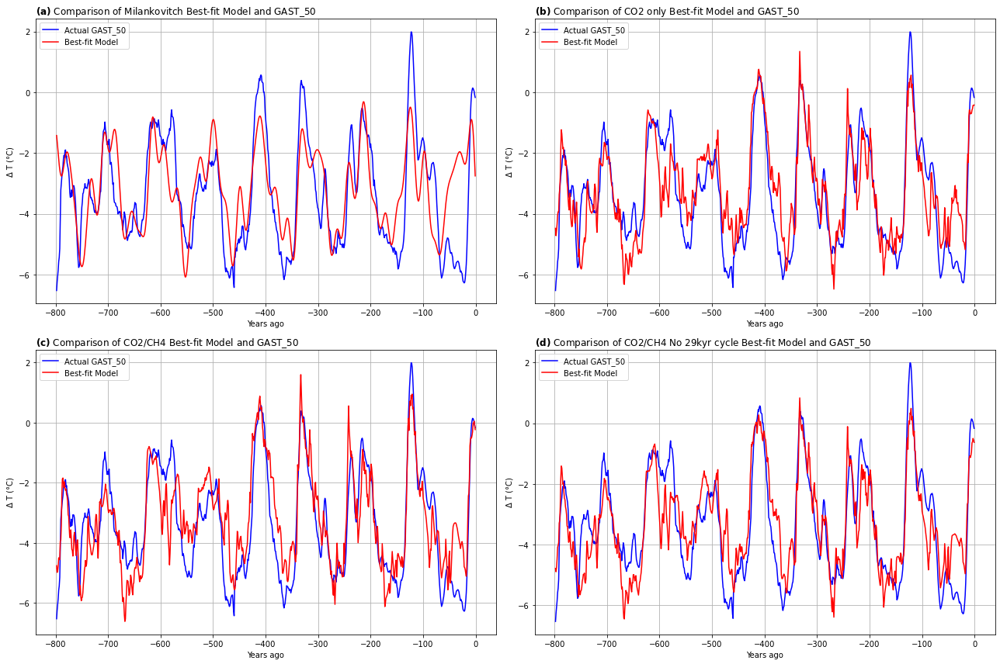

In [359]:
# Extract the best-fit parameters
best_fit_params_co2 = samples_co2[np.argmax(lnprob_with_co2)]
best_fit_params_gases = samples_gases[np.argmax(lnprob_with_gases)]
best_fit_params_no29 = samples_no29[np.argmax(lnprob_no29)]
best_fit_params_Mil = samples_Mil[np.argmax(lnprob_Mil)]

# Calculate the model values using the best-fit parameters
best_fit_model_co2 = model_with_co2(best_fit_params_co2, age, icecore['Hansen_CO2_formula'])
best_fit_model_gases = model_with_gases(best_fit_params_gases, age, icecore['Hansen_CO2_formula'], icecore['Hansen_CH4_formula'])
best_fit_model_no29 = model_no29(best_fit_params_no29, age, icecore['Hansen_CO2_formula'])
best_fit_model_Mil = model_Mil(best_fit_params_Mil, age)

import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot the actual GAST_50 temperature data and the best-fit model for Milankovitch cycles
axes[0, 0].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[0, 0].plot(age, best_fit_model_Mil, label='Best-fit Model', color='red')
axes[0, 0].set_xlabel('Years ago')
axes[0, 0].set_ylabel(r'$\Delta$ T (°C)')
axes[0, 0].legend()
axes[0, 0].set_title(r"$\mathbf{(a)}$ Comparison of Milankovitch Best-fit Model and GAST_50", loc='left')
axes[0, 0].grid(True)

# Plot the actual GAST_50 temperature data and the best-fit model for CO2 and CH4
axes[0, 1].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[0, 1].plot(age, best_fit_model_gases, label='Best-fit Model', color='red')
axes[0, 1].set_xlabel('Years ago')
axes[0, 1].set_ylabel(r'$\Delta$ T (°C)')
axes[0, 1].legend()
axes[0, 1].set_title(r"$\mathbf{(b)}$ Comparison of CO2 only Best-fit Model and GAST_50", loc='left')
axes[0, 1].grid(True)

# Plot the actual GAST_50 temperature data and the best-fit model for CO2 only
axes[1, 0].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[1, 0].plot(age, best_fit_model_co2, label='Best-fit Model', color='red')
axes[1, 0].set_xlabel('Years ago')
axes[1, 0].set_ylabel(r'$\Delta$ T (°C)')
axes[1, 0].legend()
axes[1, 0].set_title(r"$\mathbf{(c)}$ Comparison of CO2/CH4 Best-fit Model and GAST_50", loc='left')
axes[1, 0].grid(True)

# Plot the actual GAST_50 temperature data and the best-fit model for CO2 and CH4 without the 29kyr cycle
axes[1, 1].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[1, 1].plot(age, best_fit_model_no29, label='Best-fit Model', color='red')
axes[1, 1].set_xlabel('Years ago')
axes[1, 1].set_ylabel(r'$\Delta$ T (°C)')
axes[1, 1].legend()
axes[1, 1].set_title(r"$\mathbf{(d)}$ Comparison of CO2/CH4 No 29kyr cycle Best-fit Model and GAST_50", loc='left')
axes[1, 1].grid(True)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()



## Predictions for future 1000/5000 years

### Adding Recent Data

CH4 Montreal gasses provided by Advanced Global Atmospheric Gases Experiment (AGAGE)
Provider:
Advanced Global Atmospheric Gases Experiment (AGAGE)
https://www.eea.europa.eu/data-and-maps/data-providers-and-partners/advanced-global-atmospheric-gases-experiment
Dataset URL:
https://agage.mit.edu/data/agage-data
<br><br>
CO2 concentration provided by National Oceanic and Atmospheric Administration (NOAA)
Provider:
National Oceanic and Atmospheric Administration (NOAA)
https://www.eea.europa.eu/data-and-maps/data-providers-and-partners/noaa-national-oceanic-and-atmospheric-administration
Dataset URL:
https://www.esrl.noaa.gov/gmd/dv/data/?category=Greenhouse%2BGases
<br><br>
For Temperatures check MyBiB citation Berkeley Earth

In [32]:
# Read the CSV file
greenhouse_import = pd.read_csv('data/greenhouse_gases.csv')
greenhouse_import.columns = ['Year', 'Value', 'Type']

# Create separate DataFrames for each gas type
co2_data = greenhouse_import[greenhouse_import['Type'] == 'CO2 (ppm)'][['Year', 'Value']].rename(columns={'Value': 'CO2_ppm'})
ch4_data = greenhouse_import[greenhouse_import['Type'] == 'CH4 (ppb)'][['Year', 'Value']].rename(columns={'Value': 'CH4_ppb'})
n2o_data = greenhouse_import[greenhouse_import['Type'] == 'N2O (ppb)'][['Year', 'Value']].rename(columns={'Value': 'N2O_ppb'})

# Merge the DataFrames on the 'Year' column
greenhouse = pd.merge(co2_data, ch4_data, on='Year', how='outer')
greenhouse = pd.merge(greenhouse, n2o_data, on='Year', how='outer')

# Convert 'Year' column to int and other columns to float
greenhouse['Year'] = greenhouse['Year'].astype(int)
greenhouse['CO2_ppm'] = greenhouse['CO2_ppm'].astype(float)
greenhouse['CH4_ppb'] = greenhouse['CH4_ppb'].astype(float)
greenhouse['N2O_ppb'] = greenhouse['N2O_ppb'].astype(float)

# Drop rows where at least one of 'CO2_ppm', 'CH4_ppb', or 'N2O_ppb' is NaN
greenhouse = greenhouse.dropna(subset=['CO2_ppm', 'CH4_ppb', 'N2O_ppb'], how='any')

# Read the temperature data
temp_data = pd.read_csv('data/Complete_TAVG_summary.txt', delim_whitespace=True, skiprows=1, header=None)
temp_data.columns = ['Year', 'Annual Anomaly', 'Annual Unc.', 'Five-year Anomaly', 'Five-year Unc.']

# Filter temperature data for years that exist in the greenhouse DataFrame
temp_data_filtered = temp_data[temp_data['Year'].isin(greenhouse['Year'])]

# Merge the filtered temperature data with the greenhouse DataFrame
greenhouse = pd.merge(greenhouse, temp_data_filtered[['Year', 'Annual Anomaly', 'Annual Unc.']], on='Year', how='left')

# Drop rows where any column is NaN
greenhouse.dropna(inplace=True)

# Print the cleaned DataFrame
print(greenhouse.head())
print(greenhouse.tail())

   Year  CO2_ppm  CH4_ppb  N2O_ppb  Annual Anomaly  Annual Unc.
1  1755    278.0   719.97    270.3          -0.555        1.239
2  1760    278.0   720.93    270.6          -2.188        2.326
3  1765    278.0   723.71    270.9          -0.489        1.229
4  1770    278.6   726.50    271.2          -1.053        0.896
5  1775    279.3   730.53    271.5           0.081        1.127
    Year  CO2_ppm  CH4_ppb  N2O_ppb  Annual Anomaly  Annual Unc.
81  2013   395.49  1815.44   326.53           1.015        0.044
82  2014   397.45  1824.40   327.61           0.986        0.035
83  2015   399.58  1834.63   328.51           1.249        0.053
84  2016   402.87  1842.40   329.33           1.440        0.049
85  2017   405.19  1849.95   330.31           1.314        0.038


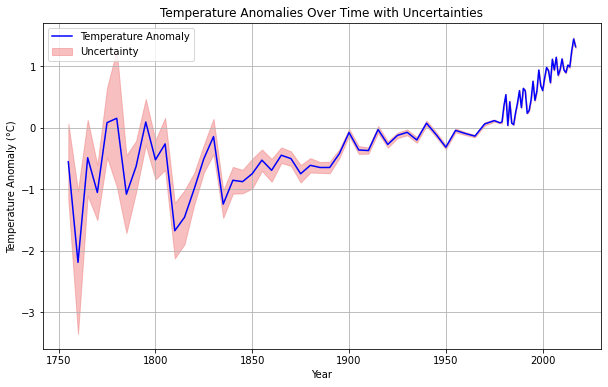

In [552]:
# Plotting temperature anomalies over time with uncertainties
plt.figure(figsize=(10, 6))

# Plotting the line plot for temperature anomalies
plt.plot(greenhouse['Year'], greenhouse['Annual Anomaly'], color='blue', label='Temperature Anomaly')

# Adding shaded area for uncertainties
plt.fill_between(greenhouse['Year'], 
                 greenhouse['Annual Anomaly'] - greenhouse['Annual Unc.']/2, 
                 greenhouse['Annual Anomaly'] + greenhouse['Annual Unc.']/2, 
                 color='lightcoral', alpha=0.5, label='Uncertainty')

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Temperature Anomaly (°C)')
plt.title('Temperature Anomalies Over Time with Uncertainties')
plt.grid(True)
plt.legend()

# Display the plot
plt.show()

In [393]:
# Get the best-fit parameters from MCMC samples
def log_likelihood_model_co2(data):
    age, T, Terr, Hansen_CO2 = data
    log_likelihood_max = -np.inf
    for theta in samples_co2:
        test = lnlike_with_co2(theta, age, T, Terr, Hansen_CO2)
        if test > log_likelihood_max:
            log_likelihood_max = test
            theta_max = theta
    return theta_max

data_co2 = (icecore['YearAD'], icecore['GAST_50'], Terr, icecore['Hansen_CO2_formula'])
best_fit_parameters = log_likelihood_model_co2(data_co2)
print(best_fit_parameters)

[-0.2279121  -0.47580848  0.16603721 -0.68128039 -0.28584893 23.79587899
 40.42702354 42.20134057 98.42987364 19.44999938  0.96101217  7.75000663]


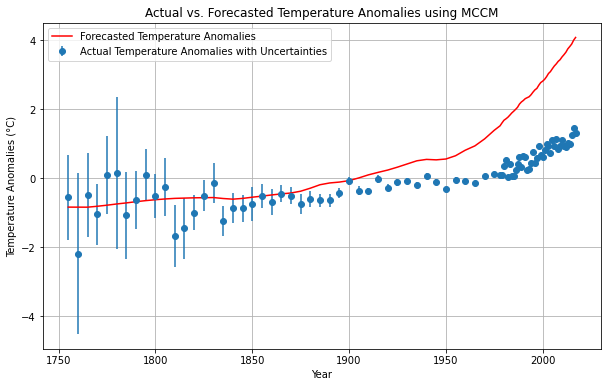

In [725]:
#Forecasting Temperature fluctuations
plt.figure(figsize=(10, 6))

#Compute impact of CO2 and CH4
Hansen_CO2 = impact_of_co2_on_delta_t(greenhouse['CO2_ppm'])
Hansen_CH4 = impact_of_ch4_on_delta_t(greenhouse['CH4_ppb']/1000)

fit_params_values = np.median(samples_co2, axis=0)

#test
Hansen_0 = np.zeros(len(greenhouse['Year']))

forecast_temp = model_with_co2(fit_params_values, greenhouse['Year']/1000, Hansen_CO2) #Call function will return temp anomalies

# Plot actual temperature anomalies and uncertainties
plt.errorbar(greenhouse['Year'], greenhouse['Annual Anomaly'], yerr=greenhouse['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')

# Plot forecasted temperature anomalies
plt.plot(greenhouse['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

# Add labels and legend
plt.xlabel('Year')
plt.ylabel('Temperature Anomalies (°C)')
plt.title('Actual vs. Forecasted Temperature Anomalies using MCCM')
plt.legend()

# Show plot
plt.grid(True)
plt.show()


Optimized X: 0.4161371800557668
Optimized T_0: -0.867396627669614


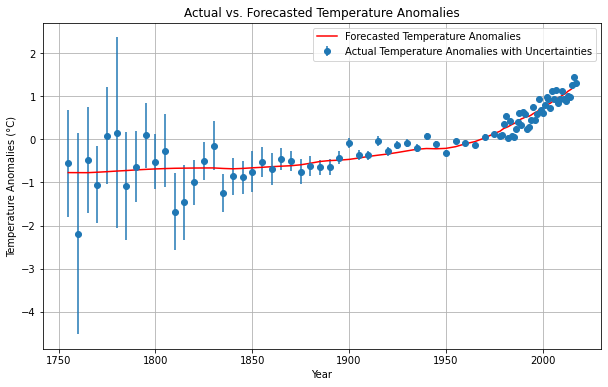

In [395]:
#Forecasting Temperature fluctuations with Best fit Aerosols coefs and Temp Constant
plt.figure(figsize=(10, 6))

best_fit_parameters = np.median(samples_co2, axis=0)
# Define the model function including aerosols and temperature constant
def model_with_co2_aerosols(parameters, year, Hansen_CO2, aerosols_coefficient, T_0_coefficient):
    return model_with_co2(parameters, year, Hansen_CO2 * aerosols_coefficient) + T_0_coefficient

import scipy.optimize as optimize

# Define a function to minimize (e.g., mean squared error)
def objective_function(params):
    X, T_0 = params
    forecast_temp = model_with_co2_aerosols(best_fit_parameters, greenhouse['Year'] / 1000, Hansen_CO2, X, T_0)
    return np.mean((forecast_temp - greenhouse['Annual Anomaly'])**2)

# Initial guess for X and T_0
initial_guess = [1, -1]

# Perform optimization
result = optimize.minimize(objective_function, initial_guess)

# Extract the optimized values for X and T_0
X_optimized, T_0_optimized = result.x

# Print the optimized values
print("Optimized X:", X_optimized)
print("Optimized T_0:", T_0_optimized)


# Calculate forecasted temperature anomalies using the obtained coefficients
forecast_temp = model_with_co2_aerosols(best_fit_parameters, greenhouse['Year'] / 1000, Hansen_CO2, X_optimized, T_0_optimized)

# Plot actual temperature anomalies and uncertainties
plt.errorbar(greenhouse['Year'], greenhouse['Annual Anomaly'], yerr=greenhouse['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')

# Plot forecasted temperature anomalies
plt.plot(greenhouse['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

# Add labels and legend
plt.xlabel('Year')
plt.ylabel('Temperature Anomalies (°C)')
plt.title('Actual vs. Forecasted Temperature Anomalies')
plt.legend()

# Show plot
plt.grid(True)
plt.show()

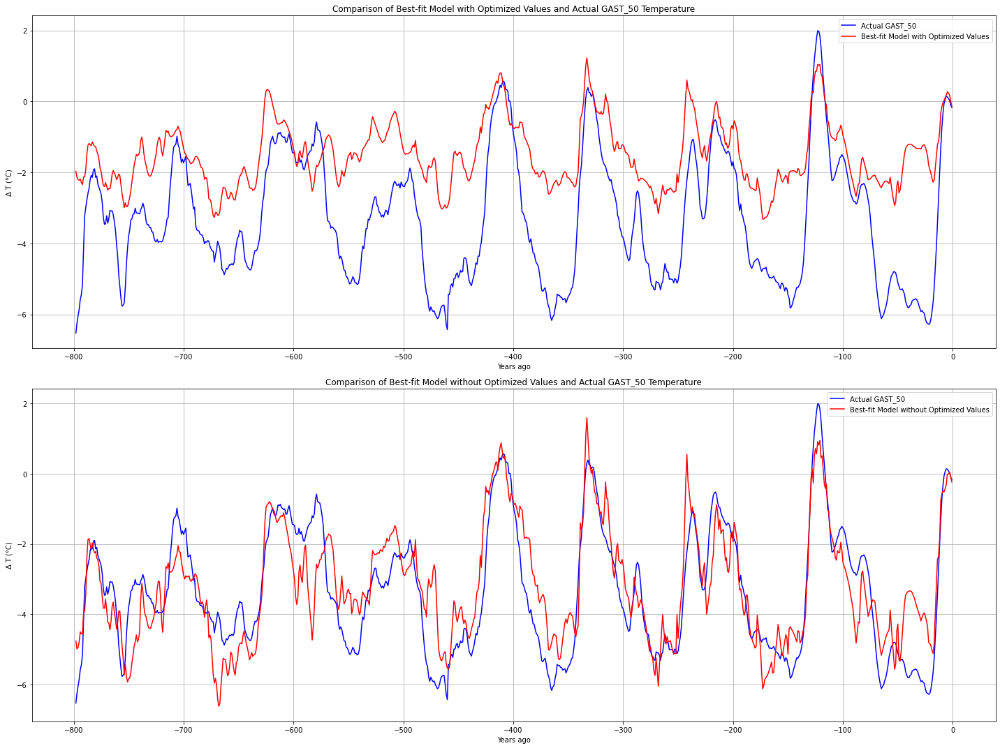

In [551]:
# Extract the best-fit parameters
best_fit_params = samples_co2[np.argmax(lnprob_with_co2)]

# Calculate the model values using the best-fit parameters
best_fit_model = model_with_co2(best_fit_params, age, icecore['Hansen_CO2_formula'])
best_fit_model_newdata = model_with_co2(best_fit_params, age, icecore['Hansen_CO2_formula']*X_optimized) + T_0_optimized

# Create the subplots
fig, axes = plt.subplots(2, 1, figsize=(20, 15))

# Plot the actual GAST_50 temperature data and the best-fit model with optimized values
axes[0].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[0].plot(age, best_fit_model_newdata, label='Best-fit Model with Optimized Values', color='red')
axes[0].set_xlabel('Years ago')
axes[0].set_ylabel(r'$\Delta$ T (°C)')
axes[0].legend()
axes[0].set_title('Comparison of Best-fit Model with Optimized Values and Actual GAST_50 Temperature')
axes[0].grid(True)

# Plot the actual GAST_50 temperature data and the best-fit model without optimized values
axes[1].plot(age, icecore['GAST_50'], label='Actual GAST_50', color='blue')
axes[1].plot(age, best_fit_model, label='Best-fit Model without Optimized Values', color='red')
axes[1].set_xlabel('Years ago')
axes[1].set_ylabel(r'$\Delta$ T (°C)')
axes[1].legend()
axes[1].set_title('Comparison of Best-fit Model without Optimized Values and Actual GAST_50 Temperature')
axes[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

We can see that aerosols cancel about half of impact of CO2:
![Radiative Forcing](Radiative_Forcing.png)

# Adding Aerosol and Albedo Data

In [642]:
import numpy as np
from PIL import Image
import pandas as pd

# Load the image
image_path = 'SAOD_Data.png'  # replace with your image path
image = Image.open(image_path)
pixels = np.array(image)

# Adjusted red color range based on provided samples
red_color_range = ([100, 0, 0], [220, 170, 170])  # Adjusted red color range
light_red_color_range = ([220, 0, 0], [255, 170, 170])  # Adjusted light red color range

# Define scaling factors
pixel_width = 158  # pixels representing 100 years
pixel_height = 115  # pixels representing 0.4 SAOD
years_per_pixel = 100 / pixel_width
saod_per_pixel = 0.4 / 126

# Reset blue_df and red_df to empty data frames
red_df = pd.DataFrame(columns=['Year', 'SAOD'])

# Prepare lists to store the results
red_pixels = []

# Function to check if a pixel is within the color range
def is_color_in_range(pixel, color_range):
    return all(lower <= value <= upper for value, (lower, upper) in zip(pixel, zip(*color_range)))

# Process the image
for y in range(pixels.shape[0]):
    for x in range(pixels.shape[1]):
        pixel = pixels[y, x, :3]  # Get RGB values
        if is_color_in_range(pixel, red_color_range):
            red_pixels.append((x, y))
        elif is_color_in_range(pixel, light_red_color_range):
            red_pixels.append((x, y))

# Convert pixel positions to age and SAOD values
def convert_to_age_saod(pixel_list):
    return [(x * years_per_pixel + 1700, float((pixel_height - y) * saod_per_pixel)) for x, y in pixel_list]  # Convert SAOD to float

red_data = convert_to_age_saod(red_pixels)

# Combine data into a structured format
red_df = pd.DataFrame(red_data, columns=['Year', 'SAOD'])

# Round the Age column to integers
red_df['Year'] = red_df['Year'].round().astype(int)

# Sort by increasing Age and take max SAOD value for each Age
red_df = red_df.groupby('Year').agg({'SAOD': 'max'}).reset_index()

print("\nRed Curve Data ICI Model (Rounded Age and Averaged SAOD):")
print(red_df)



Red Curve Data ICI Model (Rounded Age and Averaged SAOD):
     Year      SAOD
0    1700  0.022222
1    1701  0.022222
2    1704  0.025397
3    1706  0.022222
4    1719  0.022222
..    ...       ...
149  1991  0.149206
150  1992  0.120635
151  1993  0.050794
152  1994  0.034921
153  1995  0.022222

[154 rows x 2 columns]


In [649]:
# Merge saod_df with greenhouse DataFrame
#greenhouse = pd.merge(greenhouse, red_df, on='Year', how='left')
#greenhouse.drop(columns=['SAOD_x'], inplace=True)
#greenhouse = pd.merge(greenhouse, red_df, on='Year', how='left')
#print(greenhouse)
# Drop rows with NaN values
greenhouse_2 = greenhouse.copy()
# Iterate through rows of greenhouse DataFrame
for index, row in greenhouse_2.iterrows():
    if pd.isna(row['SAOD']):  # Check if SAOD value is NaN
        year = row['Year']
        # Search for matching years within a 3-year range in red_df
        nearby_rows = red_df[(red_df['Year'] >= year - 3) & (red_df['Year'] <= year + 3)]
        if not nearby_rows.empty:  # If matching rows are found
            # Take the SAOD value from the nearest year
            nearest_row = nearby_rows.iloc[0]  # Take the first row as it is sorted by increasing year
            saod_value = nearest_row['SAOD']
            # Update the SAOD value in the greenhouse DataFrame
            greenhouse_2.loc[index, 'SAOD'] = saod_value
greenhouse_2.dropna(inplace=True)
print(greenhouse_2)

#print(greenhouse_2.head())

    Year  CO2_ppm  CH4_ppb  N2O_ppb  Annual Anomaly  Annual Unc.    Albedo  \
2   1765   278.00   723.71   270.90          -0.489        1.229  0.210801   
3   1770   278.60   726.50   271.20          -1.053        0.896  0.211002   
4   1775   279.30   730.53   271.50           0.081        1.127  0.211153   
5   1780   280.10   734.57   271.80           0.152        2.211  0.211053   
6   1785   280.80   739.29   272.10          -1.081        1.261  0.211244   
8   1795   282.30   747.40   272.70           0.091        0.748  0.211617   
9   1800   282.90   750.80   273.00          -0.522        0.636  0.211874   
10  1805   283.40   755.45   273.24          -0.264        0.842  0.211546   
11  1810   283.80   760.11   273.48          -1.674        0.901  0.211858   
12  1815   284.00   764.92   273.72          -1.457        0.873  0.211969   
13  1820   284.20   769.73   273.96          -0.997        0.516  0.212231   
15  1830   284.40   779.35   274.44          -0.145        0.574

Optimized aerosol coef: [1.]


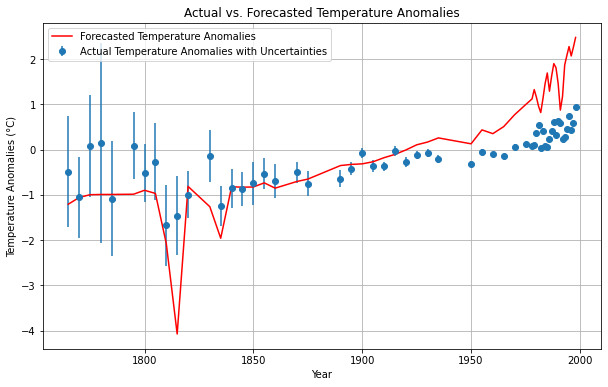

In [650]:
# Create the SAOD_Data
def aerosol_to_T(column):
    return column * -6.5

# Forecasting Temperature fluctuations with Best fit Aerosols coefs and Temp Constant
plt.figure(figsize=(10, 6))

SAOD_Data = aerosol_to_T(greenhouse_2['SAOD'])
Hansen_CO2_aerosol = impact_of_co2_on_delta_t(greenhouse_2['CO2_ppm'])
best_fit_parameters = np.median(samples_co2, axis=0)

# Define the model function including aerosols and temperature constant
def model_with_co2_aerosols(parameters, year, Hansen_CO2, aerosols_coef, SAOD):
    return model_with_co2(parameters, year, Hansen_CO2) + SAOD*aerosols_coef

import scipy.optimize as optimize

# Define a function to minimize (e.g., mean squared error)
def objective_function(params):
    coef = params
    forecast_temp_stat = model_with_co2_aerosols(best_fit_parameters, greenhouse_2['Year'] / 1000, Hansen_CO2_aerosol, coef, SAOD_Data)
    return np.mean((forecast_temp_stat - greenhouse_2['Annual Anomaly'])**2)

# Initial guess for X and T_0
initial_guess = [1]
# Perform optimization
result = optimize.minimize(objective_function, initial_guess)

# Extract the optimized values for X and T_0
coef_aerosol = result.x
# Print the optimized values
print("Optimized aerosol coef:", aerosol_optimized)

# Calculate forecasted temperature anomalies using the obtained coefficients
forecast_temp = model_with_co2_aerosols(best_fit_parameters, greenhouse_2['Year'] / 1000, Hansen_CO2_aerosol, coef_aerosol, SAOD_Data)
# Plot actual temperature anomalies and uncertainties
plt.errorbar(greenhouse_2['Year'], greenhouse_2['Annual Anomaly'], yerr=greenhouse_2['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')
# Plot forecasted temperature anomalies
plt.plot(greenhouse_2['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

# Add labels and legend
plt.xlabel('Year')
plt.ylabel('Temperature Anomalies (°C)')
plt.title('Actual vs. Forecasted Temperature Anomalies')
plt.legend()

# Show plot
plt.grid(True)
plt.show()

In [651]:
import numpy as np
from PIL import Image
import pandas as pd

# Load the image
image_path = 'Albedo_Measurement.png'  # replace with your image path
image = Image.open(image_path)
pixels = np.array(image)

# Define the color ranges for blue and red detection (tolerance included)
blue_color_range = ([72, 120, 200], [88, 130, 230])

# Define scaling factors
pixel_width = 506/3.16  # pixels representing 100 years
pixel_height = 1390  # pixels representing 0.4 SAOD
years_per_pixel = 100 / pixel_width
albedo_per_pixel = 0.014 / pixel_height

# Reset blue_df and red_df to empty data frames
blue_df = pd.DataFrame(columns=['Year', 'Albedo'])

# Prepare lists to store the results
blue_pixels = []
red_pixels = []

# Function to check if a pixel is within the color range
def is_color_in_range(pixel, color_range):
    return all(lower <= value <= upper for value, (lower, upper) in zip(pixel, zip(*color_range)))

# Process the image
for y in range(pixels.shape[0]):
    for x in range(pixels.shape[1]):
        pixel = pixels[y, x, :3]  # Get RGB values
        if is_color_in_range(pixel, blue_color_range):
            blue_pixels.append((x, y))
        elif is_color_in_range(pixel, light_blue_color_range):
            blue_pixels.append((x, y))
        elif is_color_in_range(pixel, red_color_range):
            red_pixels.append((x, y))
        elif is_color_in_range(pixel, light_red_color_range):
            red_pixels.append((x, y))

# Convert pixel positions to age and SAOD values
def convert_to_age_alb(pixel_list):
    return [(x * years_per_pixel + 1700, float(0.2065 + (pixel_height - y) * albedo_per_pixel)) for x, y in pixel_list]  # Convert SAOD to float

blue_data = convert_to_age_alb(blue_pixels)

# Combine data into a structured format
blue_df = pd.DataFrame(blue_data, columns=['Year', 'Albedo'])

# Round the Age column to integers
blue_df['Year'] = blue_df['Year'].round().astype(int)

# Sort by increasing Age and take max SAOD value for each Age
blue_df = blue_df.groupby('Year').agg({'Albedo': 'max'}).reset_index()
print("Blue Curve Data (Rounded Age and Averaged Albedo):")
print(blue_df)

Blue Curve Data (Rounded Age and Averaged Albedo):
    Year    Albedo
0   1702  0.210096
1   1712  0.210206
2   1727  0.210358
3   1729  0.210519
4   1737  0.210438
..   ...       ...
80  1992  0.218868
81  1994  0.219231
82  1995  0.219473
83  1997  0.219453
84  2010  0.219835

[85 rows x 2 columns]


In [580]:
# Merge albedo_df with greenhouse DataFrame
#greenhouse = pd.merge(greenhouse, blue_df, on='Year', how='left')
#greenhouse.drop(columns=['Albedo'])
#greenhouse.drop(columns=['SAOD_x', 'SAOD_y', 'SAOD'], inplace=True)
# Drop rows with NaN values
#greenhouse_2 = greenhouse.copy()
# Iterate through rows of greenhouse DataFrame

"""for index, row in greenhouse.iterrows():
    if pd.isna(row['Albedo']):  # Check if SAOD value is NaN
        year = row['Year']
        # Search for matching years within a 3-year range in red_df
        nearby_rows = blue_df[(blue_df['Year'] >= year - 3) & (blue_df['Year'] <= year + 3)]
        if not nearby_rows.empty:  # If matching rows are found
            # Take the SAOD value from the nearest year
            nearest_row = nearby_rows.iloc[0]  # Take the first row as it is sorted by increasing year
            saod_value = nearest_row['Albedo']
            # Update the SAOD value in the greenhouse DataFrame
            greenhouse.loc[index, 'Albedo'] = saod_value"""

#greenhouse_3 = greenhouse.copy()
greenhouse_3.dropna(inplace=True)

print(len(greenhouse_3['Year']))

57


# Regression of CO2, CH4, Aerosols, Albedo

Regression on parameters of best_fit_co2
Optimized CO2_coef: 3.2475482991879088
Optimized CH4_coef: -0.5739464961506046
Optimized aerosol coef: 0.4459982201691349
Optimized albedo coef: 1.0004879523852768
----------------------------------------
Regression on parameters of best_fit_ch4
Optimized CO2_coef: 3.2725289688659402
Optimized CH4_coef: -0.6087788129296982
Optimized aerosol coef: 0.4464141109760129
Optimized albedo coef: 1.0004887192405159
----------------------------------------


<Figure size 720x432 with 0 Axes>

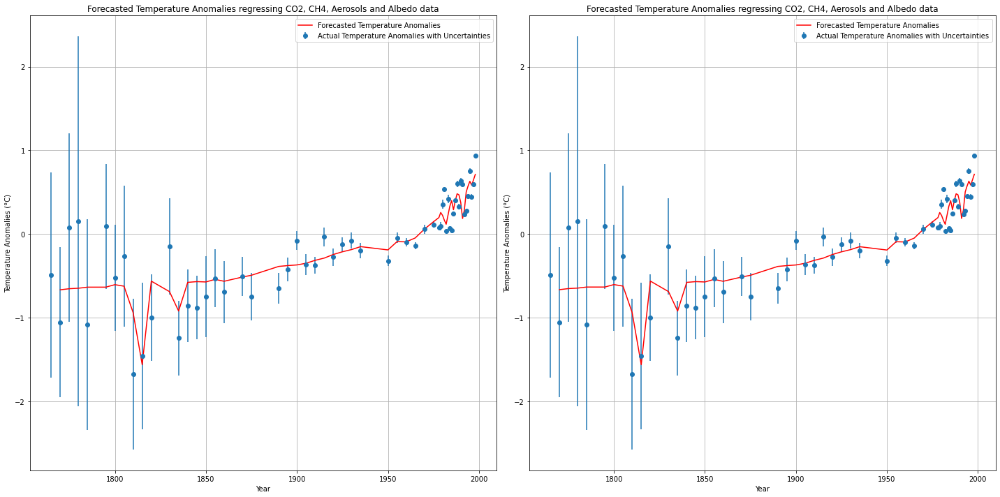

In [726]:
import scipy.optimize as optimize

def aerosol_to_T(column):
    return column * -6.5
def Delta_albedo_to_T(column):
    return column * -0.12

#Get the difference in albedo
Diff_albedo = greenhouse_3['Albedo'].diff()
#Multiply it by 10/3 as by Hansen land change is a proxy and does 30% of albedo change
Diff_albedo = Diff_albedo*10/3

# Forecasting Temperature fluctuations with Best fit Aerosols coefs and Temp Constant
plt.figure(figsize=(10, 6))

#Define the transformed Aerosols, Albedo
SAOD_Data = aerosol_to_T(greenhouse_3['SAOD'])
Albedo_Data = Delta_albedo_to_T(Diff_albedo)

#Define the transformed GHG 
Hansen_CH4_extra = impact_of_ch4_on_delta_t(greenhouse_3['CH4_ppb'])
Hansen_CO2_extra = impact_of_co2_on_delta_t(greenhouse_3['CO2_ppm'])

#Define the best fit parameters for co2 and ch4: We only care about Milankovitch ones!
best_fit_co2 = np.median(samples_co2, axis=0)[:11]
best_fit_ch4 = np.median(samples_gases, axis=0)[:11]

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes = axes.flatten()

i=0
type_of_model = ['best_fit_co2', 'best_fit_ch4']
regression_values = []
forecasts_temp = []
best_fits = [best_fit_co2, best_fit_ch4]
for best_fit in [best_fit_co2, best_fit_ch4]:
    # Define the model function including aerosols and temperature constant
    def model_reg(best_fit, year, CO2_coef, Hansen_CO2_extra, CH4_coef, Hansen_CH4_extra, 
                  aerosols_coef, SAOD, albedo_coef, Albedo):
        return model_Mil(best_fit, year) +Hansen_CO2_extra*CO2_coef +Hansen_CH4_extra*CH4_coef +SAOD*aerosols_coef +Albedo*albedo_coef

    # Define a function to minimize (e.g., mean squared error)
    def objective_function(params):
        co2, ch4, aerosols, albedo = params
        forecast_temp_stat = model_reg(best_fit, greenhouse_3['Year'] / 1000, co2, Hansen_CO2_extra, ch4, 
                                       Hansen_CH4_extra, aerosols, SAOD_Data, albedo, Albedo_Data)
        return np.mean((forecast_temp_stat - greenhouse_3['Annual Anomaly'])**2)

    # Initial guess for X and T_0
    initial_guess = [1, 1, 1, 1]
    # Perform optimization
    result = optimize.minimize(objective_function, initial_guess)

    # Extract the optimized values for X and T_0
    CO2_coef, CH4_coef, coef_aerosol, coef_albedo = result.x
    # Print the optimized values
    print(f"Regression on parameters of {type_of_model[i]}")
    print("Optimized CO2_coef:", CO2_coef)
    print("Optimized CH4_coef:", CH4_coef)
    print("Optimized aerosol coef:", coef_aerosol)
    print("Optimized albedo coef:", coef_albedo)
    print('----------------------------------------')
    regression_values.append((CO2_coef, CH4_coef, coef_aerosol, coef_albedo))

    # Calculate forecasted temperature anomalies using the obtained coefficients
    forecast_temp = model_reg(best_fit, greenhouse_3['Year'] / 1000, CO2_coef, Hansen_CO2_extra, CH4_coef, Hansen_CH4_extra, 
                  coef_aerosol, SAOD_Data, coef_albedo, Albedo_Data)
    forecasts_temp.append(forecast_temp)
    # Plot actual temperature anomalies and uncertainties
    axes[i].errorbar(greenhouse_3['Year'], greenhouse_3['Annual Anomaly'], yerr=greenhouse_3['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')
    # Plot forecasted temperature anomalies
    axes[i].plot(greenhouse_3['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

    # Add labels and legend
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Temperature Anomalies (°C)')
    axes[i].set_title(f'Forecasted Temperature Anomalies regressing CO2, CH4, Aerosols and Albedo data')
    axes[i].legend()
    # Show plot
    axes[i].grid(True)
    i+=1
    
plt.tight_layout()
plt.show()

### We hence use the data from CH4 

In [711]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

r_squared = []
for i in range(2):
   # Check for NaN values in forecast_temp
    nan_indices = np.isnan(forecasts_temp[i])
    # Handle NaN values
    if np.any(nan_indices):
        # Remove NaN values from both arrays
        greenhouse_3_clean = greenhouse_3[~nan_indices]
        forecast_temp_clean = forecasts_temp[i][~nan_indices]

        # Calculate fit statistics with cleaned data
        r2 = r2_score(greenhouse_3_clean['Annual Anomaly'], forecast_temp_clean)
        r_squared.append(r2)
        rmse = mean_squared_error(greenhouse_3_clean['Annual Anomaly'], forecast_temp_clean, squared=False)
        mae = mean_absolute_error(greenhouse_3_clean['Annual Anomaly'], forecast_temp_clean)
    else:
        # Calculate fit statistics without handling NaN values
        r2 = r2_score(greenhouse_3['Annual Anomaly'], forecasts_temp[i])
        r_squared.append(r2)
        rmse = mean_squared_error(greenhouse_3['Annual Anomaly'], forecasts_temp[i], squared=False)
        mae = mean_absolute_error(greenhouse_3['Annual Anomaly'], forecasts_temp[i])
    # Print fit statistics
    print("R-squared:", r2)
    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Error:", mae)

correlation_coef = r_squared[1]




R-squared: 0.7389556224484375
Root Mean Squared Error: 0.29121530690251235
Mean Absolute Error: 0.21336293093663153
R-squared: 0.7391831311873077
Root Mean Squared Error: 0.291088377393882
Mean Absolute Error: 0.21326408282030332
0.7391831311873077


/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/Users/arturofavara/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


### Using Long Term Model 

Info about the Data imported IAM Data:
Model used: GCAM 6.0 NGFS
Region: World
Units: 
    CO2 (ppm)
    CH4 (ppb)

In [669]:
# Read the CSV file and clean the data
iam_data = pd.read_csv('data/IAM_Data.csv')
iam_data = iam_data.replace('#N/A', pd.NA).dropna()
iam_data = iam_data.apply(lambda x: x.str.replace(',', '.') if x.dtype == "object" else x)

# Rename columns
iam_data.columns = [str(i) for i in range(50)]

# Create a list of the years
year_iam = iam_data.iloc[3:, 0].astype(int)

# Create a list of DataFrames for the predictions
gases_pred = [iam_data.iloc[3:, 1 + j:1 + j + 7].astype(float) for j in range(0, 49, 7)]

# Define the new column names for each DataFrame
#NDCs = Nationally Determined Contributions
new_columns = ['CO2_50', 'CH4_95', 'CH4_50', 'CH4_5', 'Aerosols_5', 'Aerosols_50', 'Aerosols_95']
scenario_names = ['Below 2°C', 'Current Policies', 'Delayed transition', 'Fragmented World', 'Low demand', 'NDCs', 'Net Zero 2050']

# Assign new column names to each DataFrame and add them to a dictionary with scenario names
gases_pred_dict = {}
for df, name in zip(gases_pred, scenario_names):
    df.columns = new_columns
    gases_pred_dict[name] = df

# Optionally, convert the dictionary back to a DataFrame with multi-level columns if desired
gases_pred = pd.concat(gases_pred_dict, axis=1)

# Now `gases_pred` has the scenario names and proper columns
print(gases_pred.head())


    Below 2°C                                                                \
       CO2_50       CH4_95       CH4_50        CH4_5 Aerosols_5 Aerosols_50   
3  426.073066  1909.958247  1895.670955  1882.401961  -1.332882   -0.861631   
4  437.037908  1920.980357  1899.354056  1878.395785  -1.067774   -0.685265   
5  445.187772  1911.728884  1882.225905  1853.407023  -0.895816   -0.575652   
6  450.977706  1893.721637  1858.725006  1821.246963  -0.769320   -0.499259   
7  454.460933  1873.881656  1833.739106  1789.626187  -0.666270   -0.435827   

              Current Policies                            ...       NDCs  \
  Aerosols_95           CO2_50       CH4_95       CH4_50  ... Aerosols_5   
3   -0.364415       426.476013  1915.099198  1900.862604  ...  -1.391302   
4   -0.292186       439.624888  1960.153615  1938.917592  ...  -1.226267   
5   -0.243804       452.990500  2027.400877  1998.628174  ...  -1.128490   
6   -0.211447       466.669491  2102.469834  2067.101814  ...  -1.

In [671]:
print(greenhouse.head())

   Year  CO2_ppm  CH4_ppb  N2O_ppb  Annual Anomaly  Annual Unc.    Albedo  \
0  1755    278.0   719.97    270.3          -0.555        1.239       NaN   
1  1760    278.0   720.93    270.6          -2.188        2.326       NaN   
2  1765    278.0   723.71    270.9          -0.489        1.229  0.210801   
3  1770    278.6   726.50    271.2          -1.053        0.896  0.211002   
4  1775    279.3   730.53    271.5           0.081        1.127  0.211153   

       SAOD  
0       NaN  
1  0.022222  
2  0.038095  
3  0.025397  
4  0.022222  


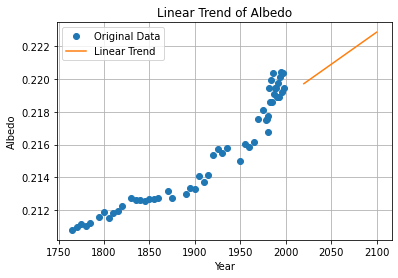

In [681]:
#Extrapolate Future Albedo values
from scipy.stats import linregress

# Assuming you have data for years and corresponding albedo values
years = greenhouse_3['Year'] # Your list of years
albedo_values = greenhouse_3['Albedo']  # Your list of albedo values

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(years, albedo_values)

# Predict albedo for the next 100 years
future_years = np.arange(2020, 2101, 5)  # Assuming you want to predict for years 2100 to 2200
predicted_albedo = slope * future_years + intercept

# Plot the original data and the linear trend
plt.plot(years, albedo_values, 'o', label='Original Data')
plt.plot(future_years, predicted_albedo, label='Linear Trend')
plt.xlabel('Year')
plt.ylabel('Albedo')
plt.title('Linear Trend of Albedo')
plt.legend()
plt.grid(True)
plt.show()

In [727]:
def impact_of_albedo_on_delta_t(albedo_values):
    # Calculate the differences between consecutive albedo values
    albedo_diff = np.diff(albedo_values)
    
    # Multiply the differences by the required constants
    albedo_diff_2 = albedo_diff * 10 / 3
    
    # Multiply by the temperature coefficient
    return albedo_diff_2 * 0.12

def radiative_forcing(column):
    return column * 0.8


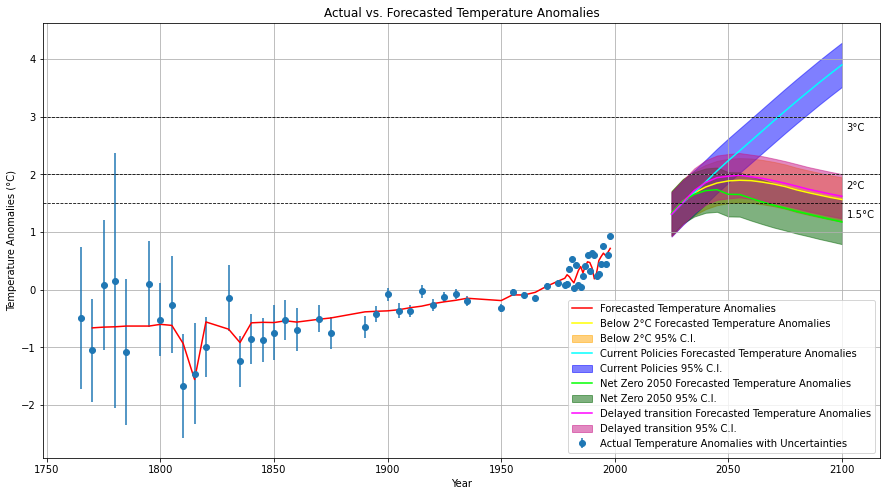

In [728]:
from scipy.stats import norm

#Forecasting Temperature fluctuations
plt.figure(figsize=(15, 8))
# Get the best-fit parameters from MCMC samples
best_fits = [np.median(samples_gases, axis=0)[:11], np.percentile(samples_gases, 2.5, axis=0)[:11], np.percentile(samples_gases, 97.5, axis=0)[:11]]
best_fit_parameters = best_fits[0]

forecast_temp = forecasts_temp[1]


#COMPUTE 95% C.I.
# Assuming best_fit_parameters and best_fits are already defined
# Calculate the standard error of the estimate (SEE)
y_actual = greenhouse_3['Annual Anomaly']
y_predicted = forecasts_temp[1]
residuals = y_actual - y_predicted
SEE = np.sqrt(np.mean(residuals**2))

# Use the correlation coefficient to estimate the uncertainty in future predictions
correlation_coefficient = correlation_coef
prediction_error = SEE * np.sqrt(1 - correlation_coefficient**2)

# Calculate the 95% confidence interval using the standard normal distribution
z_score = norm.ppf(0.975)  # 95% confidence

# Plot actual temperature anomalies and uncertainties
plt.errorbar(greenhouse_3['Year'], greenhouse_3['Annual Anomaly'], yerr=greenhouse_3['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')

# Plot forecasted temperature anomalies
plt.plot(greenhouse_3['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

# Plot future temperature predictions
colors = {
    'Below 2°C': ['yellow', 'orange'],
    'Current Policies': ['aqua', 'blue'],
    'Net Zero 2050': ['lime', 'darkgreen'],
    'Delayed transition': ['magenta', 'mediumvioletred']
}

for scenario in ['Below 2°C', 'Current Policies', 'Net Zero 2050', 'Delayed transition']:
    # Get the data for the scenario
    scenario_data = gases_pred[scenario]

    # Compute the impacts
    future_Hansen_CO2 = impact_of_co2_on_delta_t(scenario_data['CO2_50'])
    future_Hansen_CH4 = impact_of_ch4_on_delta_t(scenario_data['CH4_50'])
    future_Aerosols = radiative_forcing(scenario_data['Aerosols_50'])
    future_Albedo   = impact_of_albedo_on_delta_t(predicted_albedo)

    # Forecast future temperatures
    future_forecast_temp = model_reg(best_fit_parameters, year_iam/1000, regression_values[1][0], future_Hansen_CO2, 
                                     regression_values[1][1], future_Hansen_CH4, regression_values[1][2], 
                                     future_Aerosols, regression_values[1][3], future_Albedo)

    # Plot the future temperature line
    plt.plot(year_iam, future_forecast_temp, color=colors[scenario][0], label=f'{scenario} Forecasted Temperature Anomalies')

    # Plot the shaded area for 95% C.I.
    # Forecast future temperatures
    # Plot the shaded area for 95% C.I.
    # Forecast future temperatures
    upper_bound = future_forecast_temp + z_score * prediction_error
    lower_bound = future_forecast_temp - z_score * prediction_error

    plt.fill_between(year_iam, lower_bound, upper_bound, color=colors[scenario][1], label=f'{scenario} 95% C.I.', alpha=0.5)

# Add horizontal lines at 1.5, 2, and 3 degrees Celsius
for y in [1.5, 2, 3]:
    plt.axhline(y=y, color='black', linestyle='--', linewidth=0.8)
    plt.text(x=2102, y=y-.2, s=f'{y}°C', color='black', va='center')
    
# Add labels and legend
plt.xlabel('Year')
plt.ylabel('Temperature Anomalies (°C)')
plt.title('Actual vs. Forecasted Temperature Anomalies')
plt.legend()

# Show plot
plt.grid(True)
plt.show()


We add the 95% confidence interval in the model, the one caused by our regression

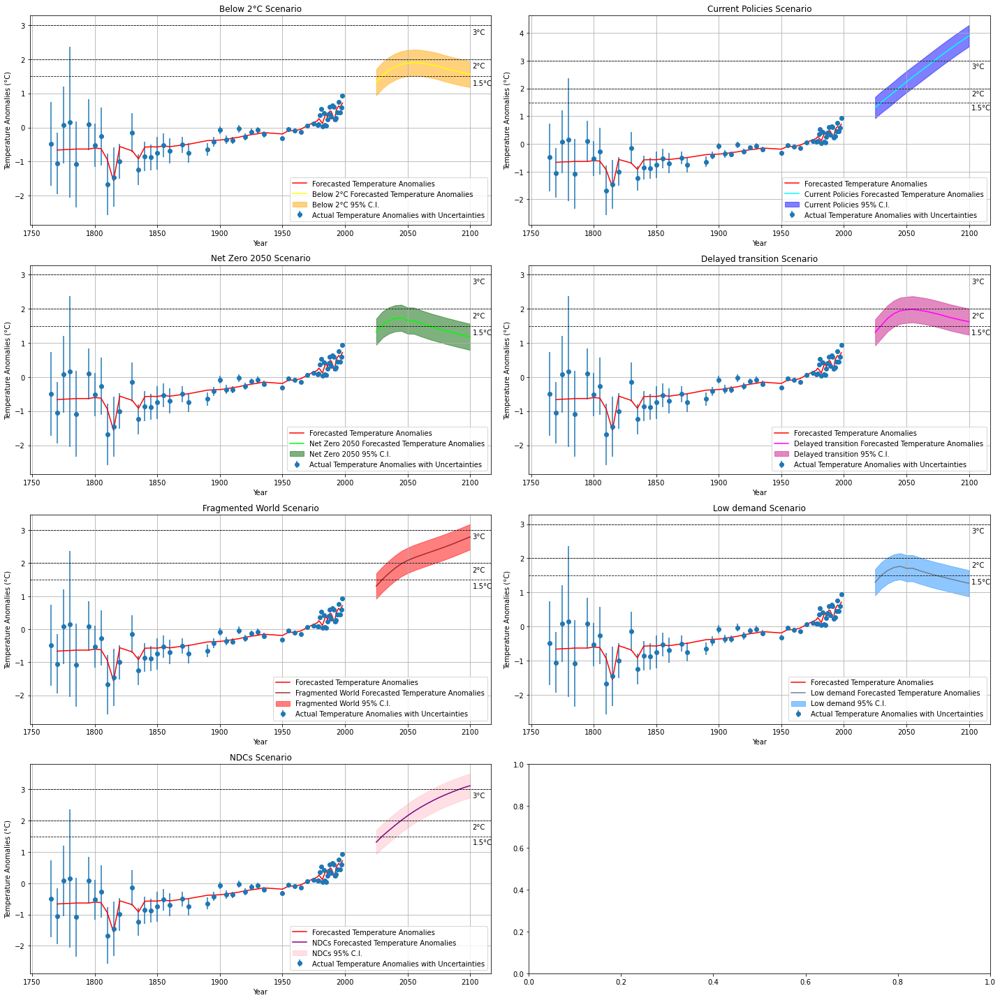

In [729]:
# Assuming that 'samples_co2', 'greenhouse', 'gases_pred', 'impact_of_co2_on_delta_t', 'impact_of_ch4_on_delta_t', and 'model_with_co2' are defined elsewhere in your code
# Forecast temperature anomalies using the best-fit parameters
forecast_temp = forecasts_temp[1]

#COMPUTE 95% C.I.
# Assuming best_fit_parameters and best_fits are already defined
# Calculate the standard error of the estimate (SEE)
y_actual = greenhouse_3['Annual Anomaly']
y_predicted = forecasts_temp[1]
residuals = y_actual - y_predicted
SEE = np.sqrt(np.mean(residuals**2))

# Create subplots
num_scenarios = len(gases_pred)
num_rows = 7 // 2 + 7 % 2  # Calculate number of rows needed for subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(20, 5 * num_rows))  # Adjust figsize based on number of rows
axes = axes.flatten()

colors = {
    'Below 2°C': ['yellow', 'orange'],
    'Current Policies': ['aqua', 'blue'],
    'Net Zero 2050': ['lime', 'darkgreen'],
    'Delayed transition': ['magenta', 'mediumvioletred'],
    'Fragmented World': ['brown', 'red'],
    'Low demand': ['slategray', 'dodgerblue'],
    'NDCs': ['purple', 'pink']
}

i=0
# Plot each scenario in a subplot
for scenario in ['Below 2°C', 'Current Policies', 'Net Zero 2050', 'Delayed transition', 'Fragmented World', 'Low demand', 'NDCs']:
    ax = axes[i]
    
    # Get the data for the scenario
    scenario_data = gases_pred[scenario]
    
    # Plot actual temperature anomalies and uncertainties
    ax.errorbar(greenhouse_3['Year'], greenhouse_3['Annual Anomaly'], yerr=greenhouse_3['Annual Unc.'], fmt='o', label='Actual Temperature Anomalies with Uncertainties')

    # Plot forecasted temperature anomalies
    ax.plot(greenhouse_3['Year'], forecast_temp, color='red', label='Forecasted Temperature Anomalies')

    # Compute the impacts
    future_Hansen_CO2 = impact_of_co2_on_delta_t(scenario_data['CO2_50'])
    future_Hansen_CH4 = impact_of_ch4_on_delta_t(scenario_data['CH4_50'])
    future_Aerosols = radiative_forcing(scenario_data['Aerosols_50'])
    future_Albedo   = impact_of_albedo_on_delta_t(predicted_albedo)

    # Forecast future temperatures
    future_forecast_temp = model_reg(best_fit_parameters, year_iam/1000, regression_values[1][0], future_Hansen_CO2, 
                                     regression_values[1][1], future_Hansen_CH4, regression_values[1][2], 
                                     future_Aerosols, regression_values[1][3], future_Albedo)

    # Plot the future temperature line
    ax.plot(year_iam, future_forecast_temp, color=colors[scenario][0], label=f'{scenario} Forecasted Temperature Anomalies')

    # Plot the shaded area for 95% C.I.
    # Forecast future temperatures
    upper_bound = future_forecast_temp + z_score * prediction_error
    lower_bound = future_forecast_temp - z_score * prediction_error

    ax.fill_between(year_iam, lower_bound, upper_bound, color=colors[scenario][1], label=f'{scenario} 95% C.I.', alpha=0.5)
    
    # Add horizontal lines at 1.5, 2, and 3 degrees Celsius
    for y in [1.5, 2, 3]:
        ax.axhline(y=y, color='black', linestyle='--', linewidth=0.8)
        ax.text(x=2102, y=y-0.2, s=f'{y}°C', color='black', va='center')

    # Add labels and legend
    ax.set_xlabel('Year')
    ax.set_ylabel('Temperature Anomalies (°C)')
    ax.set_title(f'{scenario} Scenario')
    ax.legend()
    ax.grid(True)
    i+=1

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()



### Multimodality 

Dip Test Statistic: 2038.3113022274083


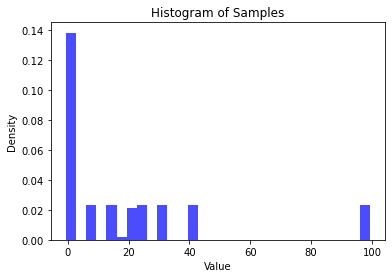

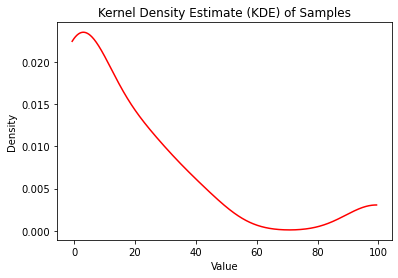

In [718]:
from scipy.stats import gaussian_kde, kde
# Flatten the samples_co2 array
flattened_samples = samples_gases[:11].flatten()

def dip_test(data):
    n = len(data)
    data = np.sort(data)
    cdf = np.arange(1, n + 1) / n - 0.5 / n
    d = np.max(np.abs(cdf - data))
    d /= np.sqrt(1.0 / (3 * n))
    return d

# Perform the Hartigan's Dip Test
dip_test_statistic = dip_test(flattened_samples)

# Print the results
print("Dip Test Statistic:", dip_test_statistic)

# Plot histogram
plt.hist(flattened_samples, bins=30, density=True, alpha=0.7, color='blue')
plt.title('Histogram of Samples')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

# Plot KDE
kde = gaussian_kde(flattened_samples)
x = np.linspace(min(flattened_samples), max(flattened_samples), 1000)
plt.plot(x, kde(x), color='red')
plt.title('Kernel Density Estimate (KDE) of Samples')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

6379


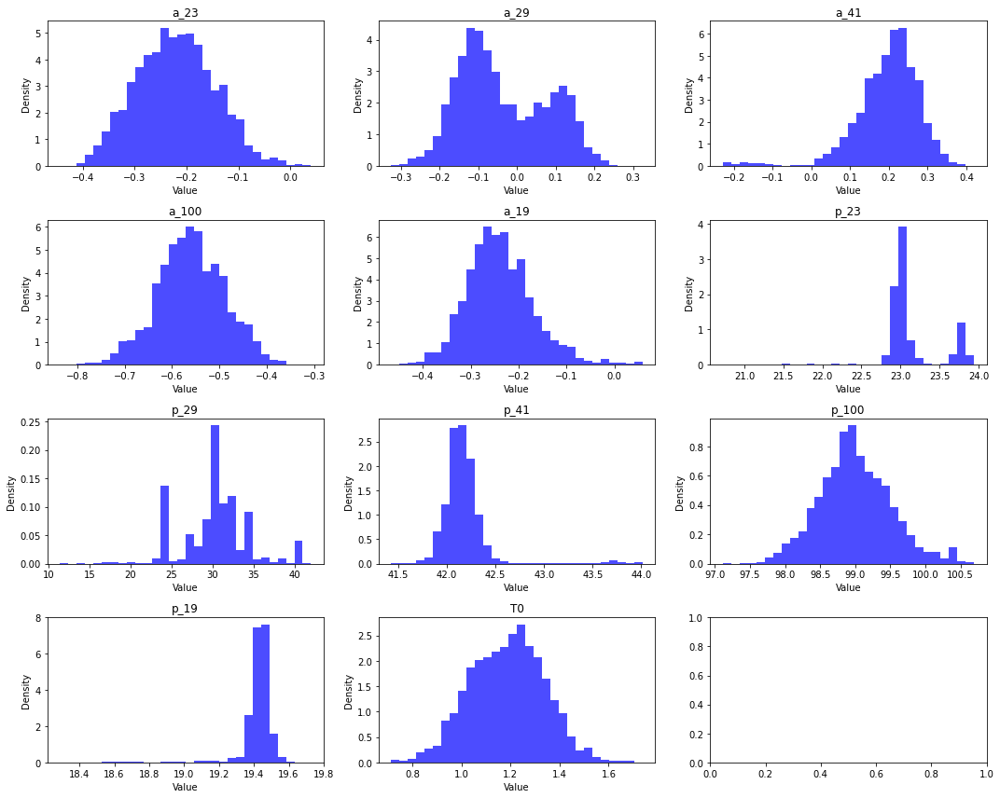

In [745]:
#We run histograms for each coefficient individually
Coefficient = ['a_23', 'a_29', 'a_41', 'a_100', 'a_19', 'p_23', 'p_29', 'p_41', 'p_100', 'p_19', 'T0']
# Determine the number of coefficients
num_coefficients = len(Coefficient)  # Assuming samples_co2 is a 2D array

# Set up the subplot layout
num_rows = 4  # Number of rows in the subplot grid
num_cols = 3  # Number of columns in the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 12))

# Flatten the Milankovitch only samples_gases array
flattened_samples = samples_gases[:11].flatten()

# Plot histograms for each coefficient
for i in range(num_coefficients):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    ax.hist(samples_gases[:, i], bins=30, density=True, alpha=0.7, color='blue')
    ax.set_title(Coefficient[i])
    ax.set_xlabel('Value')
    ax.set_ylabel('Density')

indexes = []
for i in range(len(samples_gases[:, 6])):
    if samples_gases[:, 6][i] < 25:
        indexes.append(i)

# Adjust layout
plt.tight_layout()
plt.show()


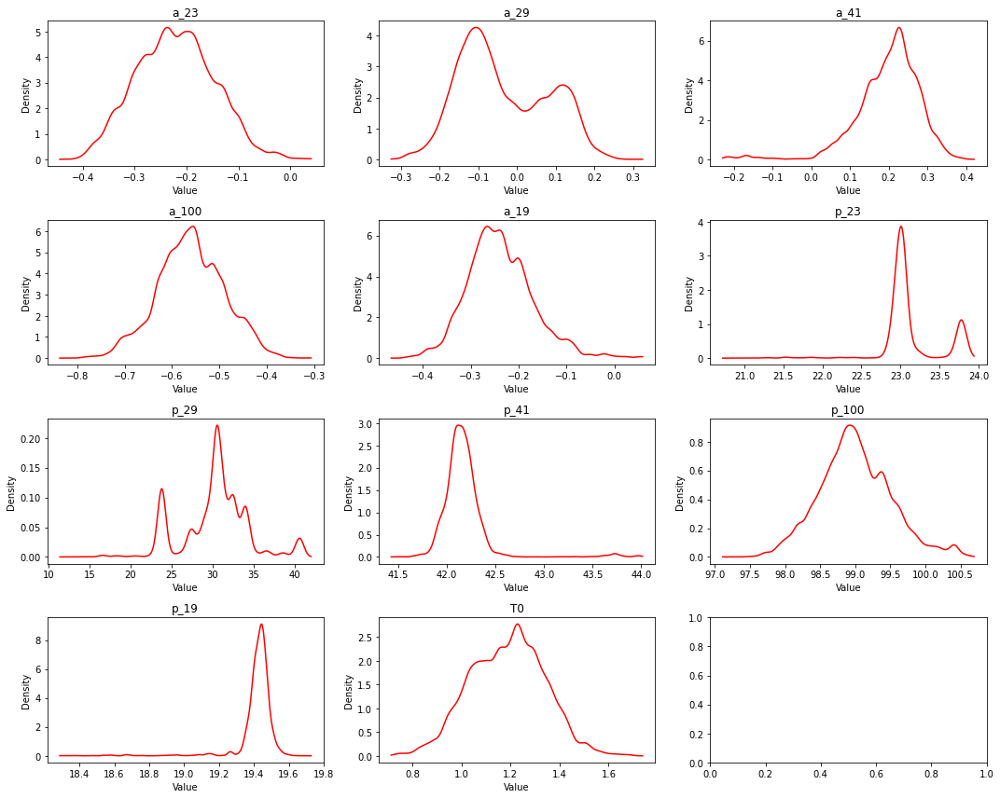

In [758]:
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

# Determine the number of coefficients
num_coefficients = len(Coefficient)  # Assuming samples_co2 is a 2D array

# Set up the subplot layout
num_rows = 4  # Number of rows in the subplot grid
num_cols = 3  # Number of columns in the subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 12))

# Plot KDEs for the first 11 coefficients
for i in range(11):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    kde = gaussian_kde(samples_gases[:, i])
    x = np.linspace(min(samples_gases[:, i]), max(samples_gases[:, i]), 1000)
    ax.plot(x, kde(x), color='red')
    ax.set_title(Coefficient[i])
    ax.set_xlabel('Value')
    ax.set_ylabel('Density')


# Adjust layout
plt.tight_layout()
plt.show()


[30.39668559 30.45900471 30.45900471 ... 23.72784124 23.72784124
 23.74086916]


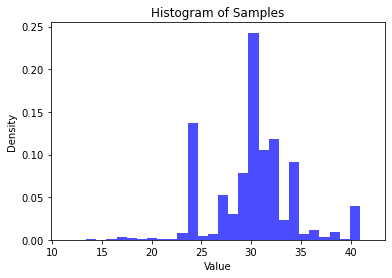

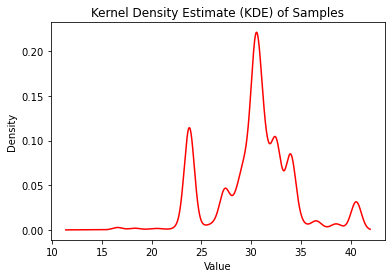

[11.36316437 11.36622579 11.36928722 ... 41.96820878 41.9712702
 41.97433162]
11.363164372093948
41.97433162312434


In [757]:
from scipy.stats import gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

print(samples_gases[:, 6])
# Plot histogram
plt.hist(samples_gases[:, 6], bins=30, density=True, alpha=0.7, color='blue')
plt.title('Histogram of Samples')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

# Plot KDE
kde = gaussian_kde(samples_gases[:, 6])
x = np.linspace(min(samples_gases[:, 6]), max(samples_gases[:, 6]), 10000)
plt.plot(x, kde(x), color='red')
plt.title('Kernel Density Estimate (KDE) of Samples')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()